### DoRothEA VS CollecTRI

&emsp;&emsp;&emsp;



<br></br>

### **Data Preparation**

In [1]:
# # Install necessary libraries
# %pip install scanpy
# %pip install decoupler
# %pip install pydeseq2
# %pip install adjustText
# %pip install omnipath
# %pip install matplotlib-venn

<!-- # Install necessary libraries
%pip install scanpy
%pip install decoupler
%pip install pydeseq2
%pip install adjustText
%pip install omnipath -->

In [2]:
# Import Necessary libraries
import scanpy as sc
import decoupler as dc
import omnipath as op

# Data Manipulation
import numpy as np
import pandas as pd
from anndata import AnnData
from scipy import stats

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib_venn import venn3
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors

# Differential Expression Analysis (DESeq2)
from pydeseq2.dds import DeseqDataSet


import warnings
warnings.filterwarnings("ignore")

import os
if not os.path.exists("datasets"):
    os.makedirs("datasets")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [3]:
# Retrieve CollecTRI gene regulatory network
try:
    collectri = dc.get_collectri(organism='human', split_complexes=False)
    collectri.to_csv("datasets/collectri.csv",index=False)
except:
    collectri = pd.read_table("datasets/collectri.csv", sep=',')
collectri

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...
...,...,...,...,...
43173,NFKB,hsa-miR-143-3p,1,19472311
43174,AP1,hsa-miR-206,1,19721712
43175,NFKB,hsa-miR-21-5p,1,20813833;22387281
43176,NFKB,hsa-miR-224-5p,1,23474441;23988648


In [4]:
# Retrieve DoRothEA gene regulatory network
try:
    # dorothea = dc.get_dorothea(organism='human')
    dorothea['weight'] = np.sign(dorothea['weight'])
    dorothea.to_csv("datasets/dorothea.csv",index=False)
except:
    dorothea = pd.read_table("datasets/dorothea.csv", sep=',')
    dorothea['weight'] = np.sign(dorothea['weight'])
dorothea

,source,confidence,target,weight
0,MYC,A,TERT,1.0
1,FOS,A,NTS,1.0
2,FOS,A,NTF3,1.0
3,FOS,A,NFKB1,-1.0
4,FOS,A,NEFL,1.0
...,...,...,...,...
32270,LEF1,C,NKD1,1.0
32271,LEF1,C,NETO2,1.0
32272,LEF1,C,MYO18B,1.0
32273,LEF1,C,PHLDB2,1.0


In [5]:
# Download GSE186341 Data
df_gse186341 = pd.read_csv("datasets/GSE186341__deresults_deseqfiltered.csv", sep=",", index_col=0).T
df_gse186341

ID,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2MP1,A3GALT2,A4GALT,A4GNT,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
DU145_AZD5363_v_DU145_DMSO,NaN,1.388290,NaN,NaN,NaN,NaN,NaN,NaN,-0.685083,NaN,...,0.626731,0.752848,NaN,-1.367168,-0.493515,0.235048,-0.752776,-2.496335,-1.034335,0.457740
PANC1_AFATINIB_v_PANC1_DMSO,NaN,0.397981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.742715,-1.219882,NaN,NaN,-1.562164,NaN,0.554136,0.836142,0.869692,-0.240313
HCC1143_TIVANTINIB_v_HCC1143_DMSO,NaN,-0.489952,NaN,NaN,NaN,NaN,NaN,NaN,0.457873,NaN,...,0.273729,0.103023,NaN,NaN,0.723085,NaN,0.153537,-0.521075,0.272643,0.667981
PANC1_CRIZOTINIB_v_PANC1_DMSO,NaN,2.251490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.624936,-0.000303,NaN,NaN,0.724345,NaN,0.516557,-0.882671,0.381799,0.455217
PANC1_MK2206_v_PANC1_DMSO,NaN,-0.552421,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.797144,0.061272,NaN,NaN,1.443461,NaN,-0.163740,0.519291,0.782504,-0.080141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.981341,-1.058985,NaN,NaN,NaN,NaN,2.415272,-0.707890,-0.701863,0.009879
HCC1143_AZD5363_v_HCC1143_DMSO,NaN,-1.519386,NaN,NaN,NaN,NaN,NaN,NaN,-0.131585,NaN,...,-2.465480,-0.905809,NaN,NaN,-0.636081,NaN,1.302778,0.750566,0.924691,0.732722
HF2597_MK2206_v_HF2597_DMSO,2.023806,0.280534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.909432,-0.373079,NaN,-1.189409,0.367076,NaN,0.668076,0.374469,-0.427420,0.397206
PANC1_BOSUTINIB_v_PANC1_DMSO,NaN,-0.099218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.944181,0.168055,NaN,NaN,1.299756,NaN,0.085410,0.766960,-0.513396,0.453244


### **TF Calculation**

#### Calculate the TF activity

In [6]:
# Create empty dataframes for storing results
df_collectri_acts = pd.DataFrame()
df_collectri_pvals = pd.DataFrame()
df_dorothea_acts = pd.DataFrame()
df_dorothea_pvals = pd.DataFrame()

# Loop through each row of df_gse186341
for _, row in df_gse186341.iterrows():
    # Drop NaN values
    mat = row.dropna().to_frame().T  # Convert series back to DataFrame with dropped NaN
    
    # Run the function for collectri
    tf_collectri_acts, tf_collectri_pvals = dc.run_ulm(mat=mat, net=collectri, verbose=True)
    
    # Run the function for dorothea
    tf_dorothea_acts, tf_dorothea_pvals = dc.run_ulm(mat=mat, net=dorothea, verbose=True)
    
    # Append results to the respective dataframes
    df_collectri_acts = pd.concat([df_collectri_acts, tf_collectri_acts], axis=0)
    df_collectri_pvals = pd.concat([df_collectri_pvals, tf_collectri_pvals], axis=0)
    df_dorothea_acts = pd.concat([df_dorothea_acts, tf_dorothea_acts], axis=0)
    df_dorothea_pvals = pd.concat([df_dorothea_pvals, tf_dorothea_pvals], axis=0)


Running ulm on mat with 1 samples and 11319 targets for 573 sources.
Running ulm on mat with 1 samples and 11319 targets for 276 sources.
Running ulm on mat with 1 samples and 10862 targets for 572 sources.
Running ulm on mat with 1 samples and 10862 targets for 280 sources.
Running ulm on mat with 1 samples and 11818 targets for 622 sources.
Running ulm on mat with 1 samples and 11818 targets for 283 sources.
Running ulm on mat with 1 samples and 10837 targets for 572 sources.
Running ulm on mat with 1 samples and 10837 targets for 280 sources.
Running ulm on mat with 1 samples and 10857 targets for 575 sources.
Running ulm on mat with 1 samples and 10857 targets for 280 sources.
Running ulm on mat with 1 samples and 11890 targets for 612 sources.
Running ulm on mat with 1 samples and 11890 targets for 283 sources.
Running ulm on mat with 1 samples and 10162 targets for 535 sources.
Running ulm on mat with 1 samples and 10162 targets for 275 sources.
Running ulm on mat with 1 samples 

In [7]:
df_collectri_acts

,ABL1,AHR,AIRE,AP1,APEX1,AR,ARID1A,ARID3A,ARID3B,ARID4A,...,TOX3,HOPX,ETV2,ELF2,FEV,SALL1,MYT1,ZFX,MNX1,SETBP1
DU145_AZD5363_v_DU145_DMSO,0.576391,0.313342,-1.465099,-1.571703,-2.189390,-0.253578,0.239259,1.716455,1.749306,-1.303459,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_AFATINIB_v_PANC1_DMSO,-0.824977,0.369159,1.071127,0.628135,1.149997,-0.660158,-2.844814,-1.374043,1.394538,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_TIVANTINIB_v_HCC1143_DMSO,-0.242661,-1.169459,-1.349713,-0.619846,-0.350687,0.162608,-0.135649,1.677687,-0.359353,1.641334,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_CRIZOTINIB_v_PANC1_DMSO,-1.416181,-0.055082,2.491645,-2.232288,0.775669,-1.643589,-2.751242,-1.216370,1.043051,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_MK2206_v_PANC1_DMSO,0.369553,-0.777148,-1.134298,1.252283,2.284807,-0.962516,-0.071933,1.508754,1.420677,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,0.969791,1.426302,0.484034,0.127050,-1.524524,3.636555,0.702857,1.592032,1.643179,-0.206159,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_AZD5363_v_HCC1143_DMSO,0.589054,0.375367,-1.224360,-0.826161,-0.272502,1.451188,-0.533359,-1.664945,-1.177217,-0.779384,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HF2597_MK2206_v_HF2597_DMSO,-0.471677,-1.723235,-1.964208,-1.967883,1.169104,-0.659350,1.921837,1.260265,-1.571305,0.453959,...,-1.527809,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_BOSUTINIB_v_PANC1_DMSO,-2.083738,-0.298484,1.354506,-0.496302,0.082580,-1.287115,-1.648785,-0.092333,1.881160,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df_collectri_pvals

,ABL1,AHR,AIRE,AP1,APEX1,AR,ARID1A,ARID3A,ARID3B,ARID4A,...,TOX3,HOPX,ETV2,ELF2,FEV,SALL1,MYT1,ZFX,MNX1,SETBP1
DU145_AZD5363_v_DU145_DMSO,0.564363,0.754027,0.142922,0.116047,0.028589,0.799826,0.810909,0.086106,0.080265,0.192445,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_AFATINIB_v_PANC1_DMSO,0.409403,0.712017,0.284136,0.529928,0.250170,0.509167,0.004452,0.169457,0.163184,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_TIVANTINIB_v_HCC1143_DMSO,0.808272,0.242242,0.177134,0.535371,0.725830,0.870830,0.892101,0.093435,0.719337,0.100755,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_CRIZOTINIB_v_PANC1_DMSO,0.156751,0.956074,0.012730,0.025616,0.437961,0.100290,0.005947,0.223870,0.296948,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_MK2206_v_PANC1_DMSO,0.711723,0.437088,0.256694,0.210494,0.022343,0.335812,0.942657,0.131391,0.155439,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,0.332177,0.153816,0.628373,0.898904,0.127413,0.000278,0.482163,0.111412,0.100381,0.836671,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_AZD5363_v_HCC1143_DMSO,0.555836,0.707394,0.220841,0.408730,0.785241,0.146754,0.593795,0.095950,0.239133,0.435769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HF2597_MK2206_v_HF2597_DMSO,0.637166,0.084872,0.049529,0.049104,0.242385,0.509684,0.054650,0.207598,0.116138,0.649866,...,0.126586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_BOSUTINIB_v_PANC1_DMSO,0.037207,0.765340,0.175603,0.619691,0.934187,0.198082,0.099221,0.926435,0.059977,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df_dorothea_acts

,AHR,AR,ARID2,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,...,RARG,GLI1,HIC1,SNAI1,STAT6,HES1,IRF8,YBX1,HNF1A,RXRB
DU145_AZD5363_v_DU145_DMSO,-1.277743,-0.389756,-2.154629,-3.202786,-2.257102,0.933693,-0.169655,-1.828778,-2.916679,-4.082260,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_AFATINIB_v_PANC1_DMSO,-1.048669,-2.041943,-0.601243,-1.076548,0.134711,-1.387388,-1.160170,-0.447542,0.624391,0.039480,...,-0.351518,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_TIVANTINIB_v_HCC1143_DMSO,-1.680458,-0.987101,-0.310142,0.625546,-2.488832,0.262623,0.183694,0.296501,-0.662161,-3.278494,...,0.309193,-1.503859,0.483405,2.042488,0.814406,NaN,NaN,NaN,NaN,NaN
PANC1_CRIZOTINIB_v_PANC1_DMSO,-0.337402,-3.456243,-1.015697,-1.281564,0.515998,-1.451040,-0.844423,-0.285264,-0.671746,0.195193,...,-0.266034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_MK2206_v_PANC1_DMSO,-1.663481,0.256444,-0.566093,0.420826,-0.541535,-0.867403,2.308927,-0.065950,0.430794,-1.384150,...,0.694237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,2.872131,2.612339,1.232357,-0.285107,3.852771,1.861744,0.771395,2.209802,1.000942,-0.361664,...,0.383499,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_AZD5363_v_HCC1143_DMSO,1.107871,-0.624524,1.535971,0.221509,0.602030,-0.747725,1.307021,1.508612,-1.488379,0.314682,...,0.334235,NaN,-1.686549,-0.374167,0.261156,NaN,NaN,NaN,NaN,NaN
HF2597_MK2206_v_HF2597_DMSO,1.500650,0.959114,3.783652,0.468039,0.012123,1.240945,2.099940,1.599020,-0.651341,1.850398,...,-0.601000,-0.006902,-0.018134,NaN,-1.585617,-0.20811,NaN,-0.267064,NaN,NaN
PANC1_BOSUTINIB_v_PANC1_DMSO,-2.227330,-1.438500,-1.680934,-1.127290,-1.248110,-0.241495,-0.539429,0.171828,-1.414202,-0.607491,...,0.949724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df_dorothea_pvals

,AHR,AR,ARID2,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,...,RARG,GLI1,HIC1,SNAI1,STAT6,HES1,IRF8,YBX1,HNF1A,RXRB
DU145_AZD5363_v_DU145_DMSO,0.201366,0.696725,0.031212,0.001365,0.024021,0.350482,0.865285,0.067459,0.003545,4.490639e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_AFATINIB_v_PANC1_DMSO,0.294354,0.041181,0.547691,0.281706,0.892843,0.165352,0.246005,0.654492,0.532384,9.685083e-01,...,0.725207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_TIVANTINIB_v_HCC1143_DMSO,0.092895,0.323613,0.756459,0.531625,0.012830,0.792846,0.854257,0.766853,0.507881,1.046643e-03,...,0.757180,0.132644,0.628817,0.041125,0.415429,NaN,NaN,NaN,NaN,NaN
PANC1_CRIZOTINIB_v_PANC1_DMSO,0.735820,0.000550,0.309796,0.200023,0.605867,0.146798,0.398451,0.775447,0.501759,8.452451e-01,...,0.790218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PANC1_MK2206_v_PANC1_DMSO,0.096245,0.797613,0.571342,0.673890,0.588150,0.385740,0.020966,0.947419,0.666627,1.663411e-01,...,0.487548,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,0.004087,0.009007,0.217848,0.775569,0.000118,0.062671,0.440493,0.027144,0.316882,7.176119e-01,...,0.701359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCC1143_AZD5363_v_HCC1143_DMSO,0.267940,0.532296,0.124572,0.824700,0.547166,0.454641,0.191231,0.131425,0.136678,7.530087e-01,...,0.738208,NaN,0.091717,0.708287,0.793977,NaN,NaN,NaN,NaN,NaN
HF2597_MK2206_v_HF2597_DMSO,0.133472,0.337521,0.000155,0.639765,0.990328,0.214650,0.035755,0.109842,0.514839,6.428071e-02,...,0.547851,0.994493,0.985532,NaN,0.112852,0.835146,NaN,0.789424,NaN,NaN
PANC1_BOSUTINIB_v_PANC1_DMSO,0.025946,0.150321,0.092804,0.259645,0.212018,0.809176,0.589602,0.863576,0.157331,5.435375e-01,...,0.342274,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Filter p-value < 0.05 in collectri TF activity
tf_collectri_acts_filtered = df_collectri_acts.loc[:, df_collectri_pvals.lt(0.05).all()]
tf_collectri_acts_filtered.shape

(352, 0)

In [12]:
# Filter p-value < 0.05 in dorothea TF activity
tf_dorothea_acts_filtered = df_dorothea_acts.loc[:, df_dorothea_pvals.lt(0.05).all()]
tf_dorothea_acts_filtered.shape

(352, 0)

#### Plot Venn Diagram of Overlap TF into groups (by significant)

all_collectri: 672
all_dorothea: 289

acts_collectri: 416
acts_dorothea: 33
acts_both: 256
acts_none: 0
acts_sum: 705


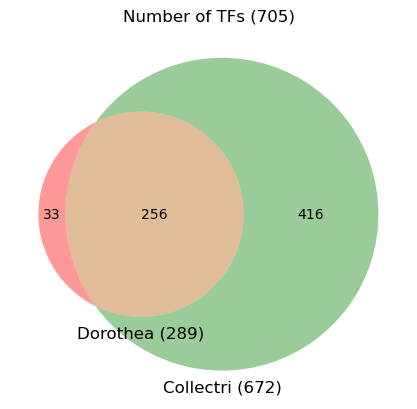

In [13]:
significant_tf_collectri = df_collectri_pvals.columns #[(df_collectri_pvals < 0.05).all()]
significant_tf_dorothea = df_dorothea_pvals.columns   #[(df_dorothea_pvals < 0.05).all()]

# Find the overlapping TFs between collectri and dorothea
overlap_tfs = set(df_collectri_acts.columns) & set(df_dorothea_acts.columns)

# Classify into 4 groups
# acts_collectri = overlap_tfs & set(significant_tf_collectri) - set(significant_tf_dorothea)
# acts_dorothea = overlap_tfs & set(significant_tf_dorothea) - set(significant_tf_collectri)
acts_collectri = set(significant_tf_collectri) - set(overlap_tfs)
acts_dorothea = set(significant_tf_dorothea) - set(overlap_tfs)
acts_both = overlap_tfs & set(significant_tf_collectri) & set(significant_tf_dorothea)
acts_none = overlap_tfs - acts_collectri - acts_dorothea - acts_both

# Convert set objects to lists
acts_collectri = list(acts_collectri)
acts_dorothea = list(acts_dorothea)
acts_both = list(acts_both)
acts_none = list(acts_none)

# Print the result
print(f"all_collectri: {len(df_collectri_pvals.columns):d}")
print(f"all_dorothea: {len(df_dorothea_pvals.columns):d}")
print("")
print(f"acts_collectri: {len(acts_collectri):d}")
print(f"acts_dorothea: {len(acts_dorothea):d}")
print(f"acts_both: {len(acts_both):d}")
print(f"acts_none: {len(acts_none):d}")
print(f"acts_sum: {len(acts_collectri)+len(acts_dorothea)+len(acts_both)+len(acts_none):d}")

# Plot Venn Diagram
venn = venn3(subsets={
    '100': len(acts_dorothea),  # Only Dorothea
    '010': len(acts_collectri),  # Only Collectri
    '110': len(acts_both),  # Significant in both
    # '001': len(acts_none)  # Not significant in either
}, set_labels=(f'Dorothea ({len(significant_tf_dorothea):d})', f'Collectri ({len(significant_tf_collectri):d})')) #, f'None ({len(acts_none):d})'
plt.title(f'Number of TFs ({len(acts_collectri)+len(acts_dorothea)+len(acts_both)+len(acts_none):d})')
plt.show()

all_collectri: 466
all_dorothea: 268

acts_collectri: 256
acts_dorothea: 58
acts_both: 210
acts_none: 0
acts_sum: 524


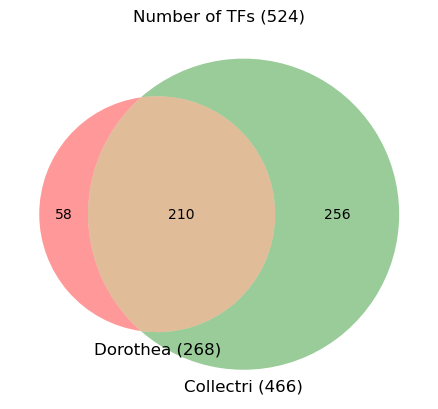

In [14]:
significant_tf_collectri = df_collectri_acts.dropna(axis=1).columns
significant_tf_dorothea = df_dorothea_acts.dropna(axis=1).columns

# Find the overlapping TFs between collectri and dorothea
overlap_tfs = set(significant_tf_collectri) & set(significant_tf_dorothea)

# Classify into 4 groups
acts_collectri = set(significant_tf_collectri) - set(overlap_tfs)
acts_dorothea = set(significant_tf_dorothea) - set(overlap_tfs)
acts_both = overlap_tfs & set(significant_tf_collectri) & set(significant_tf_dorothea)
acts_none = overlap_tfs - acts_collectri - acts_dorothea - acts_both

# Convert set objects to lists
acts_collectri = list(acts_collectri)
acts_dorothea = list(acts_dorothea)
acts_both = list(acts_both)
acts_none = list(acts_none)

# Print the result
print(f"all_collectri: {len(significant_tf_collectri):d}")
print(f"all_dorothea: {len(significant_tf_dorothea):d}")
print("")
print(f"acts_collectri: {len(acts_collectri):d}")
print(f"acts_dorothea: {len(acts_dorothea):d}")
print(f"acts_both: {len(acts_both):d}")
print(f"acts_none: {len(acts_none):d}")
print(f"acts_sum: {len(acts_collectri)+len(acts_dorothea)+len(acts_both)+len(acts_none):d}")

# Plot Venn Diagram
venn = venn3(subsets={
    '100': len(acts_dorothea),  # Only Dorothea
    '010': len(acts_collectri),  # Only Collectri
    '110': len(acts_both),  # Significant in both
    # '001': len(acts_none)  # Not significant in either
}, set_labels=(f'Dorothea ({len(significant_tf_dorothea):d})', f'Collectri ({len(significant_tf_collectri):d})')) #, f'None ({len(acts_none):d})'
plt.title(f'Number of TFs ({len(acts_collectri)+len(acts_dorothea)+len(acts_both)+len(acts_none):d})')
plt.show()

#### Classify the similarity classes

In [15]:
# Get overlapping columns
overlap_columns = df_collectri_acts.dropna(axis=1).columns.intersection(df_dorothea_acts.dropna(axis=1).columns)
overlap_columns

Index(['AHR', 'AR', 'ARID3A', 'ARNT', 'ASCL1', 'ATF1', 'ATF2', 'ATF3', 'ATF4',
       'ATF6',
       ...
       'WT1', 'XBP1', 'YY1', 'ZBED1', 'ZBTB7A', 'ZEB1', 'ZEB2', 'ZHX2',
       'ZNF143', 'ZNF384'],
      dtype='object', length=210)

In [16]:
# Filter overlap TFs in collectri
df_collectri_acts_filtered = df_collectri_acts[overlap_columns]
df_collectri_pvals_filtered = df_collectri_pvals[overlap_columns]
df_collectri_acts_filtered

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,0.313342,-0.253578,1.716455,0.173292,-2.019609,-1.093860,-0.336782,-1.438250,-1.020874,-0.535626,...,1.618699,-2.297151,-0.248922,1.511101,-0.830479,-0.540227,-0.344924,1.614599,0.006759,-0.804840
PANC1_AFATINIB_v_PANC1_DMSO,0.369159,-0.660158,-1.374043,-0.994093,-0.088586,0.839616,-0.454723,1.956183,0.621329,2.129130,...,-0.379227,1.801610,-1.205943,0.936747,1.461594,-0.795551,-0.281472,0.645018,-0.640867,-1.183327
HCC1143_TIVANTINIB_v_HCC1143_DMSO,-1.169459,0.162608,1.677687,-1.359082,-0.219069,-0.665228,-0.082807,0.102559,-1.747889,-2.495559,...,-1.835525,-2.092489,-0.830134,-0.811602,-0.676319,0.653354,1.108971,-0.262711,0.109938,-0.519449
PANC1_CRIZOTINIB_v_PANC1_DMSO,-0.055082,-1.643589,-1.216370,0.114658,-0.537562,0.218293,-2.146095,1.605541,-1.868762,0.003309,...,-0.347788,1.022810,-0.333552,2.199485,1.595765,0.039434,-0.593835,1.111186,-0.892785,-1.329577
PANC1_MK2206_v_PANC1_DMSO,-0.777148,-0.962516,1.508754,-0.028854,0.582965,1.044625,1.025344,-0.666558,-2.156435,1.606703,...,-0.294869,0.139529,-1.589717,0.838179,-0.806576,-1.850190,-0.185255,-2.393235,-1.891778,-0.388377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,1.426302,3.636555,1.592032,0.572257,0.549286,-0.154690,0.627110,2.042114,0.450246,-0.626466,...,1.571261,-1.538279,1.480158,1.669286,1.334498,-0.906769,-1.223416,0.159904,0.227753,2.014262
HCC1143_AZD5363_v_HCC1143_DMSO,0.375367,1.451188,-1.664945,0.276865,-0.692192,0.155579,-0.937635,-0.659574,-1.744178,1.561279,...,1.430493,0.306349,-0.053717,-1.019442,1.064986,-0.562562,-0.772212,-0.954086,0.701890,1.164193
HF2597_MK2206_v_HF2597_DMSO,-1.723235,-0.659350,1.260265,-1.001289,1.201816,-0.514151,-0.726907,-2.275063,-0.169575,-1.997643,...,-0.921423,-1.762327,1.878170,-1.686075,-1.199260,-1.957731,-2.141387,-0.765375,1.135965,-2.746607
PANC1_BOSUTINIB_v_PANC1_DMSO,-0.298484,-1.287115,-0.092333,0.379940,-0.619218,0.469171,-0.108634,0.819074,-0.899133,1.259913,...,0.010230,1.484408,-0.864642,1.043026,0.404029,0.077922,1.346986,1.562077,0.309145,-1.161927


In [17]:
# Filter overlap TFs in dorothea
df_dorothea_acts_filtered = df_dorothea_acts[overlap_columns]
df_dorothea_pvals_filtered = df_dorothea_pvals[overlap_columns]
df_dorothea_acts_filtered

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,-1.277743,-0.389756,-3.202786,-2.257102,0.933693,-0.169655,-1.828778,-2.916679,-4.082260,-2.335670,...,0.174203,-0.098374,-2.069436,0.030810,-0.353178,-2.171568,-0.741898,-0.665726,-2.165999,-2.996322
PANC1_AFATINIB_v_PANC1_DMSO,-1.048669,-2.041943,-1.076548,0.134711,-1.387388,-1.160170,-0.447542,0.624391,0.039480,0.657844,...,0.297356,0.399753,-0.387649,-0.211928,-2.109367,-1.199410,0.872076,-0.773475,0.778004,-1.184889
HCC1143_TIVANTINIB_v_HCC1143_DMSO,-1.680458,-0.987101,0.625546,-2.488832,0.262623,0.183694,0.296501,-0.662161,-3.278494,-2.027683,...,-1.012665,-0.499776,-1.645388,-0.298805,-1.494738,0.091542,-2.536932,-0.470885,-1.553892,-2.806041
PANC1_CRIZOTINIB_v_PANC1_DMSO,-0.337402,-3.456243,-1.281564,0.515998,-1.451040,-0.844423,-0.285264,-0.671746,0.195193,-1.207633,...,0.821343,-0.016067,-1.252378,-2.476440,-2.887247,-2.604876,-0.128900,-0.494125,0.332956,-0.625602
PANC1_MK2206_v_PANC1_DMSO,-1.663481,0.256444,0.420826,-0.541535,-0.867403,2.308927,-0.065950,0.430794,-1.384150,0.019591,...,2.480844,1.072114,-2.589946,-0.562708,-3.251324,-1.440258,-1.974493,0.559630,-1.323765,-1.734386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,2.872131,2.612339,-0.285107,3.852771,1.861744,0.771395,2.209802,1.000942,-0.361664,0.055300,...,0.869118,-0.736871,3.604323,1.641843,1.105042,0.755113,2.402467,1.224804,0.996501,1.028075
HCC1143_AZD5363_v_HCC1143_DMSO,1.107871,-0.624524,0.221509,0.602030,-0.747725,1.307021,1.508612,-1.488379,0.314682,-0.334820,...,-0.055932,-0.048639,2.309051,-0.245897,1.009206,0.768840,1.427580,1.505469,2.050568,2.049141
HF2597_MK2206_v_HF2597_DMSO,1.500650,0.959114,0.468039,0.012123,1.240945,2.099940,1.599020,-0.651341,1.850398,-0.299060,...,0.581170,0.929221,0.921364,-0.184256,0.008509,0.247201,1.107553,-0.830836,0.294161,1.464420
PANC1_BOSUTINIB_v_PANC1_DMSO,-2.227330,-1.438500,-1.127290,-1.248110,-0.241495,-0.539429,0.171828,-1.414202,-0.607491,-0.437883,...,-0.162920,-0.265869,-0.940228,-1.548987,-1.966955,-2.727013,0.905912,-0.556945,-0.399457,-2.357933


In [18]:
# Classify the similarity classes
def classify_tf_group(tf_col, tf_dor):
    if tf_col > 0 and tf_dor > 0:
        if (tf_col - tf_dor) / (tf_col + tf_dor) > 0.10:
            return 2
        elif (tf_dor - tf_col) / (tf_col + tf_dor) > 0.10:
            return 3
        else:
            return 1
    elif tf_col < 0 and tf_dor < 0:
        if (tf_col - tf_dor) / (tf_col + tf_dor) > 0.10:
            return 5
        elif (tf_dor - tf_col) / (tf_col + tf_dor) > 0.10:
            return 6
        else:
            return 4
    elif tf_col > 0 and tf_dor < 0:
        return 7
    elif tf_col < 0 and tf_dor > 0:
        return 8
    return 9

df_classes = pd.DataFrame(index=df_collectri_acts_filtered.index, columns=overlap_columns)
for col in overlap_columns:
    df_classes[col] = np.vectorize(classify_tf_group)(df_collectri_acts_filtered[col], df_dorothea_acts_filtered[col])

df_classes

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,7,6,7,7,8,5,6,6,6,6,...,2,5,6,2,5,6,6,7,7,6
PANC1_AFATINIB_v_PANC1_DMSO,7,6,5,8,6,7,4,2,2,2,...,8,2,5,7,7,6,8,7,8,4
HCC1143_TIVANTINIB_v_HCC1143_DMSO,6,7,2,6,8,8,8,7,6,5,...,5,5,6,5,6,2,7,6,7,6
PANC1_CRIZOTINIB_v_PANC1_DMSO,6,6,4,3,6,7,5,7,8,7,...,8,7,6,7,7,7,5,7,8,5
PANC1_MK2206_v_PANC1_DMSO,6,8,2,6,7,3,7,8,5,2,...,8,3,6,7,6,5,6,8,5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,3,2,7,3,3,8,3,2,7,8,...,2,5,3,1,1,8,8,3,3,2
HCC1143_AZD5363_v_HCC1143_DMSO,3,7,8,3,4,3,8,6,8,7,...,7,7,8,5,1,8,8,8,3,3
HF2597_MK2206_v_HF2597_DMSO,8,8,2,8,1,8,8,5,8,5,...,8,8,2,5,8,8,8,4,2,8
PANC1_BOSUTINIB_v_PANC1_DMSO,6,4,6,7,5,7,8,7,5,7,...,7,7,4,7,7,7,2,7,7,6


In [19]:

# Summarize count of classes on each sample
df_classes_summary = df_classes.apply(lambda row: row.value_counts(), axis=1).fillna(0).astype(int).T

# Reorder columns from 1 to 8 and fill missing rows with zeros
df_classes_summary = df_classes_summary.reindex(index=range(1, 9), fill_value=0)

# # SORTING METHODS (1 or 2 or 3)
# 1. Sort the rows by class values
# df_classes_summary_sorted = df_classes_summary.sort_values(by=list(df_classes_summary.columns), ascending=False)
# df_classes_summary_sorted = df_classes_summary.sort_values(by=list(df_classes_summary.columns[::-1]), ascending=False)

# 2. Create temporary columns for the sum of each group
# df_classes_summary['m1_sum'] = df_classes_summary[[1, 2, 3]].sum(axis=1)
# df_classes_summary['m2_sum'] = df_classes_summary[[4, 5, 6]].sum(axis=1)
# df_classes_summary['m3_sum'] = df_classes_summary[[7, 8]].sum(axis=1)
# # Sort by these temporary columns
# df_classes_summary_sorted = df_classes_summary.sort_values(by=['m1_sum', 'm2_sum', 'm3_sum'], ascending=False)
# # Drop the temporary columns
# df_classes_summary_sorted = df_classes_summary_sorted.drop(['m1_sum', 'm2_sum', 'm3_sum'], axis=1)

# 3. Sort between significant and non-significant
m1 = df_classes_summary.loc[1] + df_classes_summary.loc[2] + df_classes_summary.loc[3] + df_classes_summary.loc[4] + df_classes_summary.loc[5] + df_classes_summary.loc[6]
m2 = df_classes_summary.loc[7] + df_classes_summary.loc[8]
df_classes_summary_sorted = df_classes_summary.T.assign(m1=m1, m2=m2).sort_values(by=['m1', 'm2'], ascending=[False, False]).drop(columns=['m1', 'm2'])

# Reorder the rows based on the index of df_classes_summary_sorted
df_collectri_acts_filtered_sorted = df_collectri_acts_filtered.loc[df_classes_summary_sorted.index]
df_dorothea_acts_filtered_sorted = df_dorothea_acts_filtered.loc[df_classes_summary_sorted.index]
df_classes_sorted = df_classes.loc[df_classes_summary_sorted.index]

df_classes_summary_sorted

,1,2,3,4,5,6,7,8
HCC1143_DOVITINIB_v_HCC1143_DMSO,1,3,3,29,41,89,37,7
HCC1143_KW2449_v_HCC1143_DMSO,1,7,4,27,60,66,28,17
U87_DASATINIB_v_U87_DMSO,22,47,74,4,6,8,18,31
HCC1143_BAFETINIB_v_HCC1143_DMSO,23,45,84,0,4,5,10,39
U87_NERATINIB_v_U87_DMSO,27,61,61,1,5,4,26,25
...,...,...,...,...,...,...,...,...
H1793_AZD5363_v_H1793_DMSO,3,21,20,15,21,20,55,55
HSTS_MGCD265_v_HSTS_DMSO,5,20,29,6,21,18,28,83
LNCAP_CABOZANTINIB_v_LNCAP_DMSO,4,7,21,10,37,18,14,99
LNCAP_SORAFENIB_v_LNCAP_DMSO,10,37,10,6,12,22,88,25


In [20]:
# Summarize count of classes on each column
df_classes_summary_cols = df_classes.apply(lambda col: col.value_counts(), axis=0).fillna(0).astype(int)

# Reorder columns from 1 to 8 and fill missing rows with zeros
df_classes_summary_cols = df_classes_summary_cols.reindex(index=range(1, 9), fill_value=0)

# Sorting based on three main groups
# m1 = df_classes_summary_cols.loc[1] + df_classes_summary_cols.loc[2] + df_classes_summary_cols.loc[3]
# m2 = df_classes_summary_cols.loc[4] + df_classes_summary_cols.loc[5] + df_classes_summary_cols.loc[6]
# m3 = df_classes_summary_cols.loc[7] + df_classes_summary_cols.loc[8]

# df_classes_summary_sorted_cols = df_classes_summary_cols.T.assign(m1=m1, m2=m2, m3=m3).sort_values(by=['m1', 'm2', 'm3'], ascending=[False, False, False]).drop(columns=['m1', 'm2', 'm3'])

m1 = df_classes_summary_cols.loc[1] + df_classes_summary_cols.loc[2] + df_classes_summary_cols.loc[3] + df_classes_summary_cols.loc[4] + df_classes_summary_cols.loc[5] + df_classes_summary_cols.loc[6]
m2 = df_classes_summary_cols.loc[7] + df_classes_summary_cols.loc[8]

df_classes_summary_sorted_cols = df_classes_summary_cols.T.assign(m1=m1, m2=m2).sort_values(by=['m1', 'm2'], ascending=[False, False]).drop(columns=['m1', 'm2'])

# df_classes_summary_sorted_cols = df_classes_summary_sorted_cols.T
df_classes_summary_sorted_cols


,1,2,3,4,5,6,7,8
MYC,51,87,35,33,64,38,17,27
RELA,39,52,56,47,39,60,32,27
E2F2,33,75,62,19,50,50,29,34
NFKB1,32,60,55,29,58,54,31,33
E2F4,31,28,113,12,25,74,31,38
...,...,...,...,...,...,...,...,...
GABPA,10,21,39,11,31,42,90,108
NR2F1,9,33,33,8,27,43,107,92
MBD1,6,35,33,9,37,32,117,83
THAP11,6,28,42,10,19,44,115,88


#### Calculate Mean Expression on each TFs

In [21]:
def calculate_mean_expression(df_gse186341, tf_list, interaction_df):
    df_mean_expression = pd.DataFrame(index=df_gse186341.index)

    for tf in tf_list:
        # Filter interaction data for the current TF
        tf_data = interaction_df[interaction_df['source'] == tf]

        # Get targets and weights
        targets = tf_data['target'].tolist()
        weights = tf_data.set_index('target')['weight']

        # Keep only the targets that are present in df_gse186341
        available_targets = set(targets) & set(df_gse186341.columns)
        if not available_targets:
            # Skip this TF if none of its targets are present
            continue

        # # Subset and reindex weights to match available targets
        # weights = weights.reindex(available_targets)

        # # Filter df_gse186341 for the available targets and multiply by weights
        # weighted_exp = df_gse186341[list(available_targets)].multiply(weights, axis=1)

        # Filter df_gse186341 for the available targets and multiply by weights
        weighted_exp = df_gse186341[list(available_targets)]


        # Compute the mean expression per sample, ignoring NaNs
        mean_expression = weighted_exp.mean(axis=1, skipna=True)

        # Store in DataFrame
        df_mean_expression[tf] = mean_expression

    return df_mean_expression

# Calculate mean expression for Collectri
df_collectri_mean = calculate_mean_expression(df_gse186341, overlap_columns, collectri)

# Calculate mean expression for Dorothea
df_dorothea_mean = calculate_mean_expression(df_gse186341, overlap_columns, dorothea)



In [22]:
df_collectri_mean

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,-0.173487,-0.246507,0.540543,-0.185164,-0.400088,-0.364966,-0.167263,-0.192276,-0.277022,-0.369832,...,-0.205974,-0.559360,-0.252416,0.201523,-0.291710,-0.058347,-0.387207,-0.771578,-0.159288,-0.333063
PANC1_AFATINIB_v_PANC1_DMSO,-0.108848,-0.085391,-0.708076,-0.340510,0.040654,0.110129,-0.210234,0.078329,0.048209,0.263603,...,-0.126512,0.369933,-0.308381,-0.124000,-0.273528,-0.047644,-0.460322,-0.411966,-0.258134,-0.673573
HCC1143_TIVANTINIB_v_HCC1143_DMSO,-0.014912,0.147717,0.766813,-0.019740,0.019988,0.100219,0.104279,0.063187,0.007878,-0.270793,...,0.010015,-0.106315,0.147976,-0.010978,-0.066181,0.092454,0.008707,0.251965,0.193117,0.272628
PANC1_CRIZOTINIB_v_PANC1_DMSO,-0.068391,-0.203690,-0.671402,-0.349884,-0.193094,-0.092989,-0.398676,-0.232843,-0.221904,-0.014363,...,-0.223780,0.226003,-0.268622,0.427656,-0.071579,-0.274705,-0.721811,-0.671845,-0.327510,-0.786871
PANC1_MK2206_v_PANC1_DMSO,0.133656,0.094946,0.664181,0.143989,0.314255,0.312025,0.237790,0.242907,0.069739,0.346707,...,0.061802,0.199472,0.128432,0.300196,0.346664,0.292466,0.283480,1.023847,-0.167000,0.038888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,0.259498,0.324928,0.711320,0.241396,0.113065,0.045957,0.155951,0.307968,0.212288,0.035665,...,0.165701,-0.139926,0.333962,0.527078,0.468954,0.353267,0.394479,0.059870,0.174305,0.527898
HCC1143_AZD5363_v_HCC1143_DMSO,-0.061781,-0.041711,-0.754604,-0.076797,-0.192957,-0.163346,-0.268381,-0.106854,-0.236274,0.144081,...,0.044386,-0.083180,-0.136096,-0.380118,0.274187,-0.194079,-0.432910,0.159623,0.001088,0.087354
HF2597_MK2206_v_HF2597_DMSO,-0.028830,0.082065,0.649106,-0.308076,0.143567,0.063791,-0.041069,-0.275523,0.064273,-0.298229,...,0.055874,-0.162348,0.174745,-0.316821,-0.116682,0.201967,0.330800,0.420010,0.371964,-0.449143
PANC1_BOSUTINIB_v_PANC1_DMSO,-0.234984,-0.195924,-0.162146,-0.284586,-0.074361,-0.050654,-0.148300,-0.033269,-0.089455,0.092979,...,-0.134867,0.178854,-0.308113,0.052387,0.103994,-0.302902,-0.791597,-0.908418,-0.039536,-0.706347


In [23]:
df_dorothea_mean

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,-0.402235,-0.271177,-0.859629,-0.500749,0.043588,-0.209971,-0.461915,-0.583540,-0.587194,-0.899834,...,-0.136315,-0.189216,-0.321220,-0.154230,-0.208714,-0.400105,-0.267160,-0.382879,-0.494745,-0.550171
PANC1_AFATINIB_v_PANC1_DMSO,-0.306286,-0.281615,-0.359905,-0.076652,-0.422863,-0.244545,-0.248600,0.031294,-0.093800,0.127624,...,-0.007594,0.038935,-0.468987,-0.147507,-0.405530,-0.243958,0.034412,-0.378599,0.030284,-0.262889
HCC1143_TIVANTINIB_v_HCC1143_DMSO,-0.086848,0.117786,0.295929,-0.131245,0.210314,0.185606,0.167669,0.037080,-0.114085,-0.386303,...,-0.153824,0.050685,0.131307,0.115828,0.029647,0.153556,-0.207611,0.034712,-0.039512,-0.130638
PANC1_CRIZOTINIB_v_PANC1_DMSO,-0.158840,-0.419554,-0.423761,0.004126,-0.334252,-0.200858,-0.055994,-0.209346,-0.061489,-0.536195,...,-0.446988,-0.092327,-0.481843,-0.707767,-0.533486,-0.433908,-0.107954,-0.280368,-0.026622,-0.180472
PANC1_MK2206_v_PANC1_DMSO,-0.063781,0.207788,0.250912,0.112619,0.054051,0.388267,0.126770,0.280622,0.057988,0.181341,...,0.437666,0.444871,0.009868,0.081502,-0.092429,0.040540,-0.046638,0.324135,0.016860,0.001054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,0.613798,0.367745,0.058005,0.625065,0.460289,0.208637,0.383819,0.271144,0.088971,0.140240,...,-0.168002,-0.085922,0.426053,0.455688,0.260075,0.213732,0.480399,0.542427,0.272131,0.249297
HCC1143_AZD5363_v_HCC1143_DMSO,0.032277,-0.149438,-0.097928,-0.067945,-0.235221,-0.047107,0.008199,-0.259317,-0.115269,-0.238762,...,-0.348664,-0.155710,-0.054604,-0.190685,-0.044905,-0.024284,0.033639,0.307428,0.143816,0.084292
HF2597_MK2206_v_HF2597_DMSO,0.376361,0.204595,0.237926,0.127442,0.308980,0.310007,0.346640,-0.008430,0.319167,0.029610,...,0.263602,0.378277,0.315849,0.085851,0.131154,0.155974,0.295347,-0.155858,0.170315,0.311491
PANC1_BOSUTINIB_v_PANC1_DMSO,-0.578182,-0.237457,-0.404051,-0.329302,-0.151017,-0.190166,-0.103884,-0.285975,-0.193713,-0.275924,...,-0.089876,-0.214507,-0.411846,-0.492186,-0.400545,-0.511863,-0.029159,-0.329183,-0.188248,-0.459540


#### Classify the similarity classes using Mean

In [24]:
# Classify the similarity classes
def classify_tf_group(tf_col, tf_dor):
    if tf_col > 0 and tf_dor > 0:
        if (tf_col - tf_dor) / (tf_col + tf_dor) > 0.10:
            return 2
        elif (tf_dor - tf_col) / (tf_col + tf_dor) > 0.10:
            return 3
        else:
            return 1
    elif tf_col < 0 and tf_dor < 0:
        if (tf_col - tf_dor) / (tf_col + tf_dor) > 0.10:
            return 5
        elif (tf_dor - tf_col) / (tf_col + tf_dor) > 0.10:
            return 6
        else:
            return 4
    elif tf_col > 0 and tf_dor < 0:
        return 7
    elif tf_col < 0 and tf_dor > 0:
        return 8
    return 9

df_classes_mean = pd.DataFrame(index=df_collectri_mean.index, columns=overlap_columns)
for col in overlap_columns:
    df_classes_mean[col] = np.vectorize(classify_tf_group)(df_collectri_mean[col], df_dorothea_mean[col])

df_classes_mean

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,6,4,7,6,8,5,6,6,6,6,...,5,5,6,7,5,6,5,5,6,6
PANC1_AFATINIB_v_PANC1_DMSO,6,6,5,5,7,7,4,2,7,2,...,5,2,6,4,6,6,8,4,8,5
HCC1143_TIVANTINIB_v_HCC1143_DMSO,6,2,2,6,3,3,3,2,7,6,...,7,8,1,8,8,3,7,2,7,7
PANC1_CRIZOTINIB_v_PANC1_DMSO,6,6,5,8,6,6,5,4,5,6,...,6,7,6,7,6,6,5,5,5,5
PANC1_MK2206_v_PANC1_DMSO,7,3,2,2,2,3,2,1,1,2,...,3,3,2,2,7,2,7,2,8,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,3,1,2,3,3,3,3,1,2,3,...,7,5,3,1,2,2,1,3,3,2
HCC1143_AZD5363_v_HCC1143_DMSO,8,6,5,4,4,5,8,6,5,7,...,7,6,5,5,7,5,8,3,3,1
HF2597_MK2206_v_HF2597_DMSO,8,3,2,8,3,3,8,5,3,8,...,3,8,3,8,8,2,1,7,2,8
PANC1_BOSUTINIB_v_PANC1_DMSO,6,4,6,4,6,6,5,6,6,7,...,5,7,6,7,7,6,5,5,6,5


In [25]:

# Summarize count of classes on each sample
df_classes_summary_mean = df_classes_mean.apply(lambda row: row.value_counts(), axis=1).fillna(0).astype(int).T

# Reorder columns from 1 to 8 and fill missing rows with zeros
df_classes_summary_mean = df_classes_summary_mean.reindex(index=range(1, 9), fill_value=0)

# # SORTING METHODS (1 or 2 or 3)
# 1. Sort the rows by class values
# df_classes_summary_mean_sorted = df_classes_summary_mean.sort_values(by=list(df_classes_summary_mean.columns), ascending=False)
# df_classes_summary_mean_sorted = df_classes_summary_mean.sort_values(by=list(df_classes_summary_mean.columns[::-1]), ascending=False)

# 2. Create temporary columns for the sum of each group
# df_classes_summary_mean['m1_sum'] = df_classes_summary_mean[[1, 2, 3]].sum(axis=1)
# df_classes_summary_mean['m2_sum'] = df_classes_summary_mean[[4, 5, 6]].sum(axis=1)
# df_classes_summary_mean['m3_sum'] = df_classes_summary_mean[[7, 8]].sum(axis=1)
# # Sort by these temporary columns
# df_classes_summary_mean_sorted = df_classes_summary_mean.sort_values(by=['m1_sum', 'm2_sum', 'm3_sum'], ascending=False)
# # Drop the temporary columns
# df_classes_summary_mean_sorted = df_classes_summary_sorted.drop(['m1_sum', 'm2_sum', 'm3_sum'], axis=1)

# 3. Sort between significant and non-significant
m1 = df_classes_summary_mean.loc[1] + df_classes_summary_mean.loc[2] + df_classes_summary_mean.loc[3] + df_classes_summary_mean.loc[4] + df_classes_summary_mean.loc[5] + df_classes_summary_mean.loc[6]
m2 = df_classes_summary_mean.loc[7] + df_classes_summary_mean.loc[8]
df_classes_summary_mean_sorted = df_classes_summary_mean.T.assign(m1=m1, m2=m2).sort_values(by=['m1', 'm2'], ascending=[False, False]).drop(columns=['m1', 'm2'])

# Reorder the rows based on the index of df_classes_summary_sorted
df_collectri_mean_sorted = df_collectri_mean.loc[df_classes_summary_mean_sorted.index]
df_dorothea_mean = df_dorothea_mean.loc[df_classes_summary_mean_sorted.index]
df_classes_mean_sorted = df_classes_mean.loc[df_classes_summary_mean_sorted.index]

df_classes_summary_mean_sorted

,1,2,3,4,5,6,7,8
U87_KW2449_v_U87_DMSO,54,77,65,0,1,0,8,5
U87_NERATINIB_v_U87_DMSO,47,100,48,0,0,0,10,5
U87_LINIFANIB_v_U87_DMSO,42,108,42,0,0,0,12,6
HCC1143_DASATINIB_v_HCC1143_DMSO,0,3,0,51,96,40,9,11
DU145_BOSUTINIB_v_DU145_DMSO,0,0,0,43,89,58,10,10
...,...,...,...,...,...,...,...,...
HSTS_GEFITINIB_v_HSTS_DMSO,11,44,14,2,10,19,101,9
KRJ1_BOSUTINIB_v_KRJ1_DMSO,9,15,43,2,21,10,15,95
KRJ1_SUNITINIB_v_KRJ1_DMSO,8,18,33,7,14,17,26,87
HSTS_VARLITINIB_v_HSTS_DMSO,9,17,19,9,22,21,19,94


In [26]:
# Summarize count of classes on each column
df_classes_summary_mean_cols = df_classes_mean.apply(lambda col: col.value_counts(), axis=0).fillna(0).astype(int)

# Reorder columns from 1 to 8 and fill missing rows with zeros
df_classes_summary_mean_cols = df_classes_summary_mean_cols.reindex(index=range(1, 9), fill_value=0)

# Sorting based on three main groups
# m1 = df_classes_summary_mean_cols.loc[1] + df_classes_summary_mean_cols.loc[2] + df_classes_summary_mean_cols.loc[3]
# m2 = df_classes_summary_mean_cols.loc[4] + df_classes_summary_mean_cols.loc[5] + df_classes_summary_mean_cols.loc[6]
# m3 = df_classes_summary_mean_cols.loc[7] + df_classes_summary_mean_cols.loc[8]

# df_classes_summary_mean_sorted_cols = df_classes_summary_mean_cols.T.assign(m1=m1, m2=m2, m3=m3).sort_values(by=['m1', 'm2', 'm3'], ascending=[False, False, False]).drop(columns=['m1', 'm2', 'm3'])

m1 = df_classes_summary_mean_cols.loc[1] + df_classes_summary_mean_cols.loc[2] + df_classes_summary_mean_cols.loc[3] + df_classes_summary_mean_cols.loc[4] + df_classes_summary_mean_cols.loc[5] + df_classes_summary_mean_cols.loc[6]
m2 = df_classes_summary_mean_cols.loc[7] + df_classes_summary_mean_cols.loc[8]

df_classes_summary_mean_sorted_cols = df_classes_summary_mean_cols.T.assign(m1=m1, m2=m2).sort_values(by=['m1', 'm2'], ascending=[False, False]).drop(columns=['m1', 'm2'])

# df_classes_summary_sorted_cols = df_classes_summary_sorted_cols.T
df_classes_summary_mean_sorted_cols

,1,2,3,4,5,6,7,8
E2F1,67,112,39,31,52,32,7,12
E2F4,45,136,38,31,53,28,7,14
MYC,107,49,58,47,28,42,12,9
TP53,54,96,57,32,37,43,19,14
HIF1A,57,55,78,38,33,52,18,21
...,...,...,...,...,...,...,...,...
HINFP,16,64,25,11,45,19,88,84
GABPA,13,44,56,10,37,18,94,80
NCOA2,10,39,42,7,35,42,86,91
MBD1,12,71,27,3,32,22,106,79


#### Plot All population - Clustergram between TFs and Samples

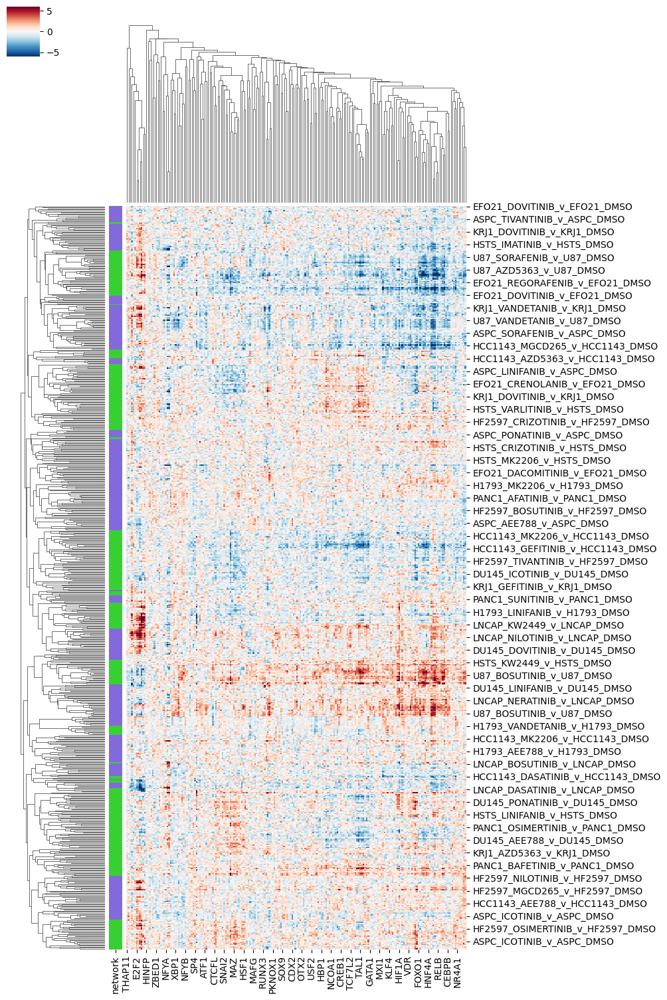

In [27]:
# Concatenate the dataframes with appropriate labels
df_collectri_acts_filtered_sorted['network'] = 'collectri'
df_dorothea_acts_filtered_sorted['network'] = 'dorothea'

combined_df = pd.concat([
    df_collectri_acts_filtered_sorted,
    df_dorothea_acts_filtered_sorted
], axis=0)

# Extract the 'source' column for use as row colors in the clustergram
row_colors = combined_df.pop('network').map({
    'collectri': "#836ada", 
    'dorothea': "#38cf33"
})

# Plot the clustergram with row colors
sns.clustermap(combined_df, metric='correlation', method='average',
               row_colors=row_colors, figsize=(10, 15), cmap='RdBu_r',
               vmin=-6, vmax=6, cbar_pos=(0, 0.95, 0.05, 0.05))

plt.show()

#### Plot All population - Summarize TF count

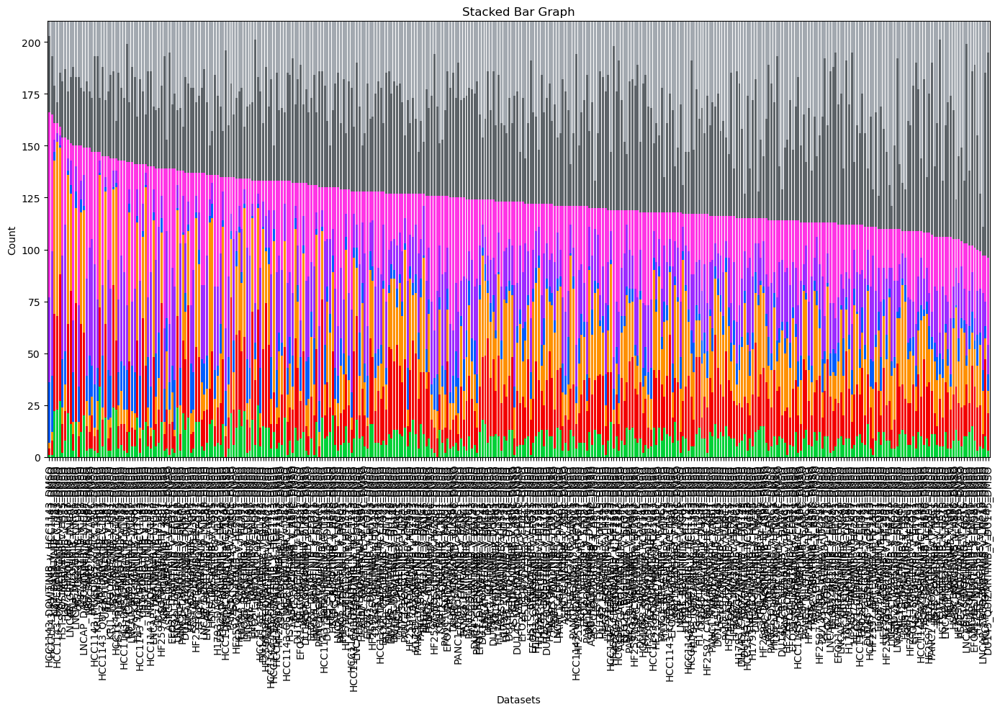

In [28]:
# Plot Summarize TF count by Datasets
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Plotting the stacked bar graph
ax = df_classes_summary_sorted.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Stacked Bar Graph")
ax.set_ylabel("Count")
ax.set_xlabel("Datasets")
ax.set_ylim([0, 210])

plt.tight_layout()
plt.show()


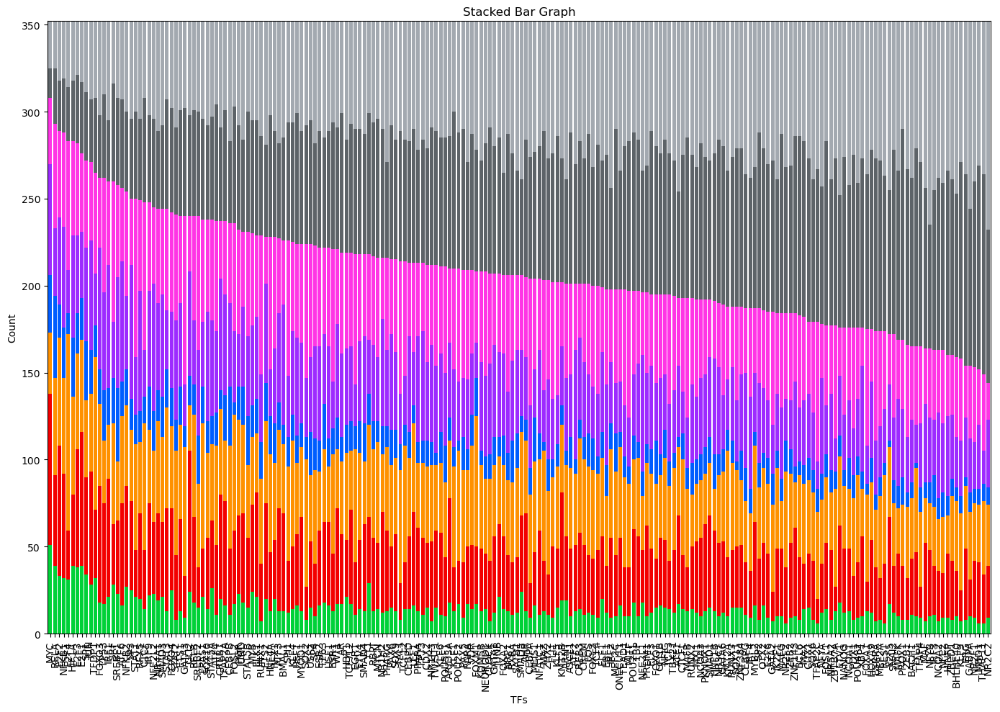

In [29]:
# Plot Summarize TF count by TF Names
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Plotting the stacked bar graph
ax = df_classes_summary_sorted_cols.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Stacked Bar Graph")
ax.set_ylabel("Count")
ax.set_xlabel("TFs")
ax.set_ylim([0, 352])

plt.tight_layout()
plt.show()

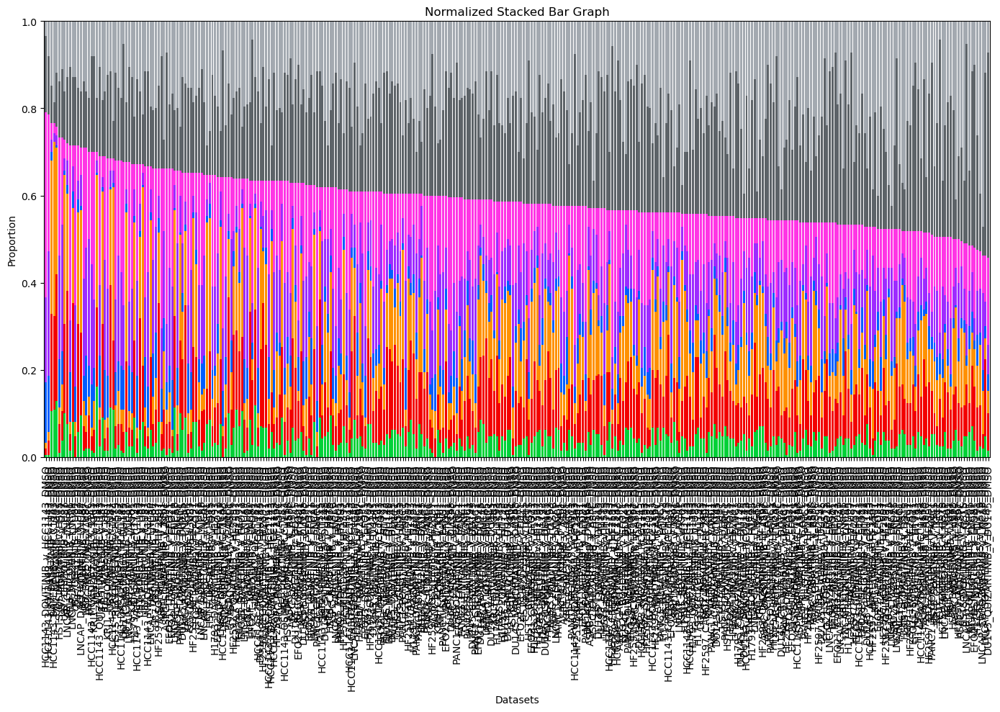

In [30]:
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Copy the dataframe and drop the 'Group' column
df_for_normalization = df_classes_summary_sorted.drop(columns='Group', errors='ignore').copy()

# Normalize the data by dividing by the sum across the row
df_normalized = df_for_normalization.div(df_for_normalization.sum(axis=1), axis=0)

# Plotting the normalized stacked bar graph
ax = df_normalized.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Normalized Stacked Bar Graph")
ax.set_ylabel("Proportion")
ax.set_xlabel("Datasets")
ax.set_ylim([0, 1])  # Set y-axis scale to 0-1 for normalized data

plt.tight_layout()
plt.show()


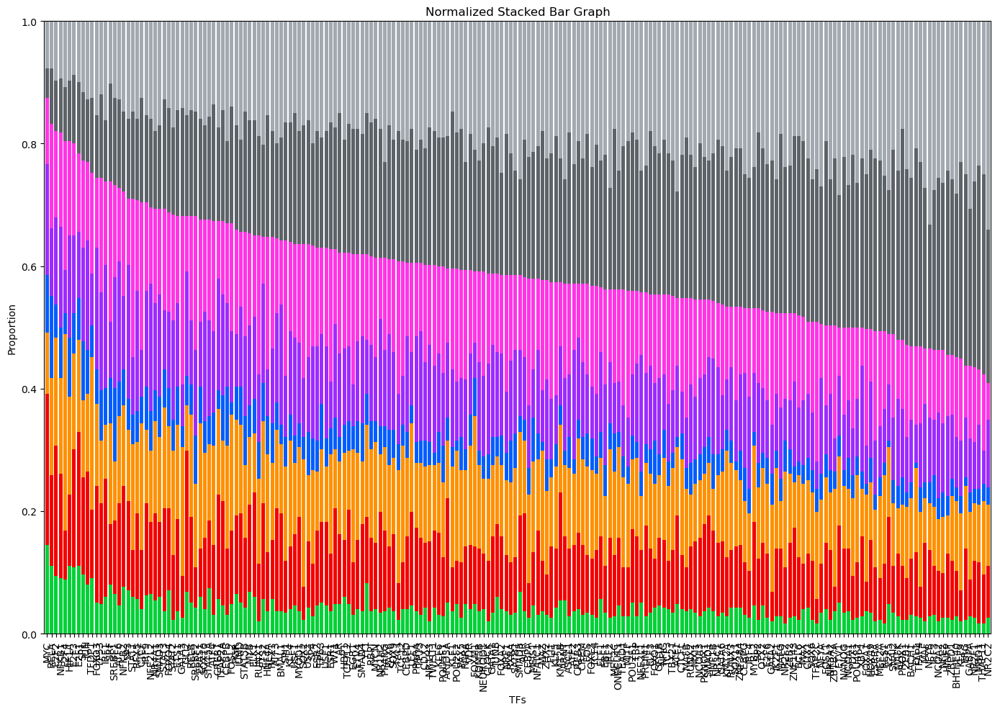

In [31]:
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Copy the dataframe and drop the 'Group' column
df_for_normalization = df_classes_summary_sorted_cols.drop(columns='Group', errors='ignore').copy()

# Normalize the data by dividing by the sum across the row
df_normalized = df_for_normalization.div(df_for_normalization.sum(axis=1), axis=0)

# Plotting the normalized stacked bar graph
ax = df_normalized.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Normalized Stacked Bar Graph")
ax.set_ylabel("Proportion")
ax.set_xlabel("TFs")
ax.set_ylim([0, 1])  # Set y-axis scale to 0-1 for normalized data

plt.tight_layout()
plt.show()


#### Plot All population - Scatter TF between CollecTRI and DoRothEA

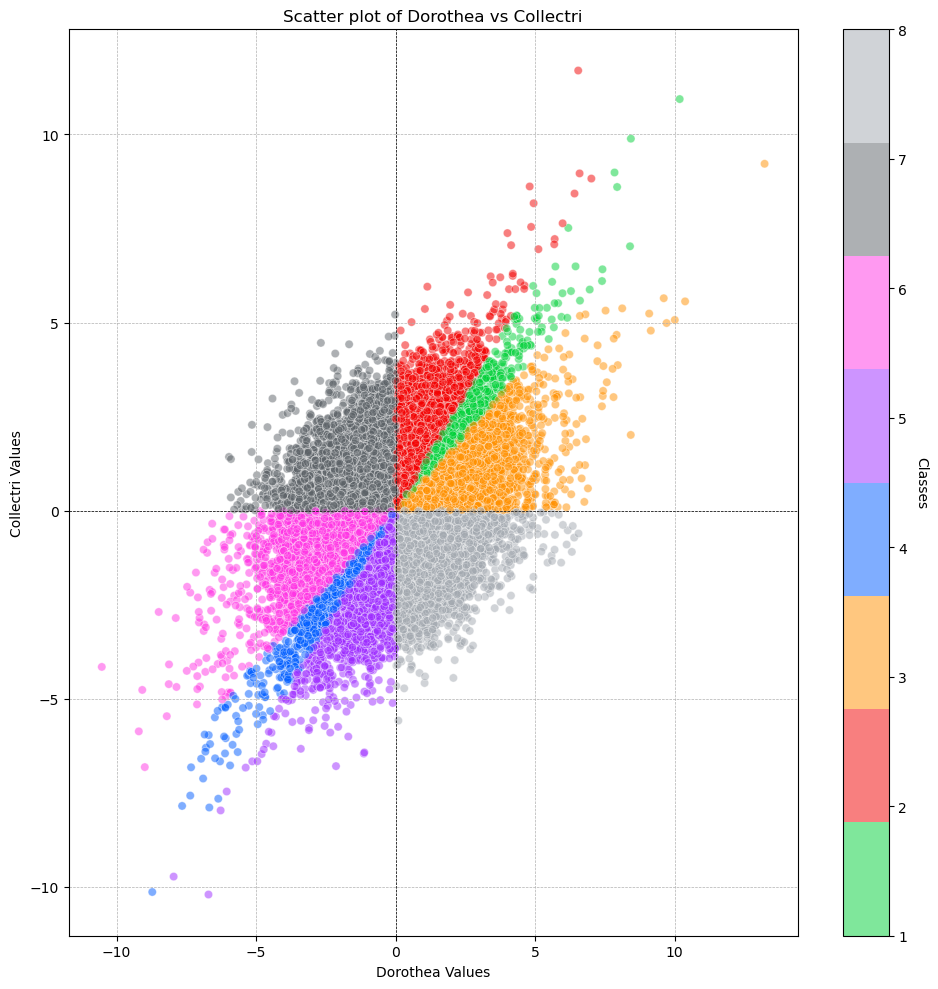

In [32]:
# Flatten the dataframes to obtain arrays
x_values = df_dorothea_acts_filtered_sorted.drop(columns="network").values.flatten()
y_values = df_collectri_acts_filtered_sorted.drop(columns="network").values.flatten()
colors = df_classes_sorted.values.flatten()

# Define the color map
cmap = ListedColormap(["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"])

# Create scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(x_values, y_values, c=colors, cmap=cmap, alpha=0.5, edgecolors="w", linewidth=0.5)

# Create a colorbar with proper ticks and labels
cbar = plt.colorbar(scatter, ticks=np.arange(1, 9))
cbar.set_label('Classes', rotation=270, labelpad=15)

plt.xlabel('Dorothea Values')
plt.ylabel('Collectri Values')
plt.title('Scatter plot of Dorothea vs Collectri')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.5)
plt.axvline(x=0, color='k', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

#### Plot All population - Jaccard Index, Size, Weight on TFs

In [69]:
# Number of rows
selected = 10

# Calculate the half index of the dataframe
half_index = len(df_classes_summary_sorted_cols) // 2

# Adjust the indices for top, middle, and bottom selection based on the value of 'selected'
top_n = df_classes_summary_sorted_cols.iloc[:selected].index.tolist()
middle_n = df_classes_summary_sorted_cols.iloc[half_index - selected//2:half_index + selected//2].index.tolist()
bottom_n = df_classes_summary_sorted_cols.iloc[-selected:].index.tolist()

def jaccard_index(set1, set2):
    intersection = len(set1 & set2)
    union = len(set1 | set2)
    if union == 0:
        return 0
    else:
        return intersection / union

def calculate_mean_expression(df_gse186341, tf_list, interaction_df):
    df_mean_expression = pd.DataFrame(index=df_gse186341.index)

    for tf in tf_list:
        # Filter interaction data for the current TF
        tf_data = interaction_df[interaction_df['source'] == tf]

        # Get targets and weights
        targets = tf_data['target'].tolist()
        weights = tf_data.set_index('target')['weight']

        # Keep only the targets that are present in df_gse186341
        available_targets = set(targets) & set(df_gse186341.columns)
        if not available_targets:
            # Skip this TF if none of its targets are present
            continue

        # # Subset and reindex weights to match available targets
        # weights = weights.reindex(available_targets)

        # # Filter df_gse186341 for the available targets and multiply by weights
        # weighted_exp = df_gse186341[list(available_targets)].multiply(weights, axis=1)

        # Filter df_gse186341 for the available targets and multiply by weights
        weighted_exp = df_gse186341[list(available_targets)]


        # Compute the mean expression per sample, ignoring NaNs
        mean_expression = weighted_exp.mean(axis=1, skipna=True)

        # Store in DataFrame
        df_mean_expression[tf] = mean_expression

    return df_mean_expression

# Calculate Jaccard Index
results = []

for tf_list, name in zip([top_n, middle_n, bottom_n], ['top_n', 'middle_n', 'bottom_n']):
    for tf in tf_list:
        for class_num in range(1, 9):
            datasets = df_classes[df_classes[tf] == class_num].index
            jaccard_values = []
            size_collectri = []
            size_dorothea = []
            weight_collectri = []
            weight_dorothea = []
            mean_collectri = []
            mean_dorothea = []
            contribute_collectri = []
            contribute_dorothea = []
            for dataset in datasets:
                columns_of_interest = df_gse186341[df_gse186341.index == dataset].dropna(axis=1).columns
                collectri_filtered = collectri[collectri['source'] == tf]
                dorothea_filtered = dorothea[dorothea['source'] == tf]
                
                targets_collectri = set(collectri_filtered['target'].tolist()) & set(columns_of_interest)
                targets_dorothea = set(dorothea_filtered['target'].tolist()) & set(columns_of_interest)
                
                jaccard_values.append(jaccard_index(targets_collectri, targets_dorothea))
                size_collectri.append(len(targets_collectri))
                size_dorothea.append(len(targets_dorothea))
                contribute_collectri.append(len(set(targets_collectri)) / len(set(collectri_filtered['target'].tolist())) * 100)
                contribute_dorothea.append(len(set(targets_dorothea)) / len(set(dorothea_filtered['target'].tolist())) * 100)
                
                weight_collectri.extend(collectri_filtered[collectri_filtered['target'].isin(targets_collectri)]['weight'])
                weight_dorothea.extend(dorothea_filtered[dorothea_filtered['target'].isin(targets_dorothea)]['weight'])

                mean_collectri.append(calculate_mean_expression(
                    df_gse186341.loc[[dataset]], 
                    [tf], 
                    collectri
                ).mean().values[0])

                mean_dorothea.append(calculate_mean_expression(
                    df_gse186341.loc[[dataset]], 
                    [tf], 
                    dorothea
                ).mean().values[0])

            mean_jaccard = np.mean(jaccard_values)
            size_collectri_mean = np.mean(size_collectri)
            size_dorothea_mean = np.mean(size_dorothea)
            contribute_collectri_mean = np.mean(contribute_collectri)
            contribute_dorothea_mean = np.mean(contribute_dorothea)
            weight_collectri_mean = np.mean(weight_collectri)
            weight_dorothea_mean = np.mean(weight_dorothea)
            mean_collectri_mean = np.mean(mean_collectri)
            mean_dorothea_mean = np.mean(mean_dorothea)
            results.append({
                'tf_group': name,
                'tf': tf,
                'class': class_num,
                'size_collectri': size_collectri,
                'size_dorothea': size_dorothea,
                'jaccard_value': jaccard_values,
                'contribute_collectri': contribute_collectri,
                'contribute_dorothea': contribute_dorothea,
                'weight_collectri': weight_collectri,
                'weight_dorothea': weight_dorothea,
                'mean_collectri': mean_collectri,
                'mean_dorothea': mean_dorothea,
                'mean_jaccard': mean_jaccard,
                'size_collectri_mean': size_collectri_mean,
                'size_dorothea_mean': size_dorothea_mean,
                'contribute_collectri_mean': contribute_collectri_mean,
                'contribute_dorothea_mean': contribute_dorothea_mean,
                'weight_collectri_mean': weight_collectri_mean,
                'weight_dorothea_mean': weight_dorothea_mean,
                'mean_collectri_mean': mean_collectri_mean,
                'mean_dorothea_mean': mean_dorothea_mean
            })

# Convert results to dataframe for plotting
df_results = pd.DataFrame(results)

# Sort results by median_jaccard
df_results_sorted = df_results.sort_values(by=['tf_group','mean_jaccard'], ascending=[False,False])

df_results_sorted

,tf_group,tf,class,size_collectri,size_dorothea,jaccard_value,contribute_collectri,contribute_dorothea,weight_collectri,weight_dorothea,...,mean_dorothea,mean_jaccard,size_collectri_mean,size_dorothea_mean,contribute_collectri_mean,contribute_dorothea_mean,weight_collectri_mean,weight_dorothea_mean,mean_collectri_mean,mean_dorothea_mean
3,top_n,MYC,4,"[593, 606, 563, 631, 683, 566, 581, 683, 681, ...","[346, 339, 325, 372, 397, 329, 338, 396, 395, ...","[0.45131375579598143, 0.42319277108433734, 0.4...","[66.77927927927928, 68.24324324324324, 63.4009...","[74.40860215053763, 72.90322580645162, 69.8924...","[1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.04606252953763007, -0.23605041841193194, -...",0.439546,621.000000,360.818182,69.932432,77.595308,0.823940,0.912992,-0.056123,-0.092353
5,top_n,MYC,6,"[664, 662, 682, 592, 594, 632, 595, 683, 608, ...","[388, 388, 397, 347, 349, 372, 348, 395, 358, ...","[0.4312925170068027, 0.4324693042291951, 0.440...","[74.77477477477478, 74.54954954954955, 76.8018...","[83.44086021505376, 83.44086021505376, 85.3763...","[1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, -...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[0.05350254225332964, 0.055897972653529304, 0....",0.439434,616.473684,358.947368,69.422712,77.192982,0.817468,0.911144,0.004276,-0.039491
7,top_n,MYC,8,"[607, 581, 567, 577, 681, 681, 661, 681, 604, ...","[358, 340, 327, 337, 396, 396, 387, 396, 356, ...","[0.43601190476190477, 0.4549763033175355, 0.44...","[68.35585585585585, 65.42792792792793, 63.8513...","[76.98924731182795, 73.11827956989248, 70.3225...","[1, 1, -1, 1, 1, 1, 1, 1, 1, -1, -1, 1, -1, 1,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.15720245386989437, 0.11353945367161195, 0....",0.439022,638.629630,371.925926,71.917751,79.984070,0.822769,0.912169,-0.001072,0.055535
2,top_n,MYC,3,"[656, 581, 631, 607, 578, 663, 595, 580, 594, ...","[382, 342, 371, 358, 337, 388, 349, 338, 347, ...","[0.4297520661157025, 0.4558359621451104, 0.431...","[73.87387387387388, 65.42792792792793, 71.0585...","[82.15053763440861, 73.54838709677419, 79.7849...","[1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, -1, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[0.2654992095821678, 0.3484937952492528, 0.205...",0.438085,617.571429,359.542857,69.546332,77.321045,0.820680,0.913223,0.089029,0.148087
0,top_n,MYC,1,"[631, 632, 596, 612, 681, 594, 632, 605, 662, ...","[371, 372, 348, 343, 396, 347, 372, 357, 388, ...","[0.43142857142857144, 0.4322396576319544, 0.44...","[71.05855855855856, 71.17117117117117, 67.1171...","[79.78494623655914, 80.0, 74.83870967741936, 7...","[1, 1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, -1, 1, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[0.2536468164971958, 0.3305186459299762, 0.185...",0.437999,619.862745,361.176471,69.804363,77.672359,0.820454,0.912812,0.137830,0.162066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,bottom_n,NR2C2,4,"[32, 34, 28, 28, 28, 39, 32, 28, 37, 37]","[86, 82, 84, 72, 75, 85, 86, 83, 84, 84]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[53.333333333333336, 56.666666666666664, 46.66...","[97.72727272727273, 93.18181818181817, 95.4545...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.3314931528251744, 0.04728275488964848, -0....",0.000000,32.300000,82.100000,53.833333,93.295455,0.888545,1.000000,-0.118002,-0.072237
236,bottom_n,NR2C2,5,"[24, 23, 36, 26, 26, 24, 34, 31, 23, 32, 28, 3...","[79, 80, 84, 72, 72, 78, 83, 74, 80, 86, 72, 7...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[40.0, 38.333333333333336, 60.0, 43.3333333333...","[89.77272727272727, 90.9090909090909, 95.45454...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.03390639760344754, 0.09884163029476785, 0....",0.000000,30.3

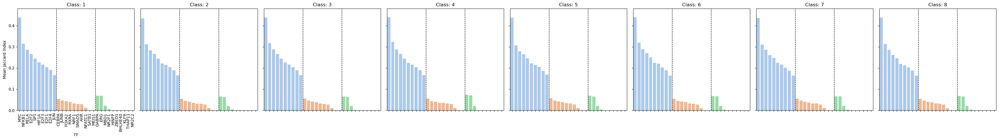

In [34]:
# Number of unique classes
num_classes = df_results_sorted['class'].nunique()

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35,5))

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_results_sorted.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_jaccard', hue='tf_group', ax=ax, dodge=False, palette="pastel")
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 0.48])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Jaccard Index')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks

    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

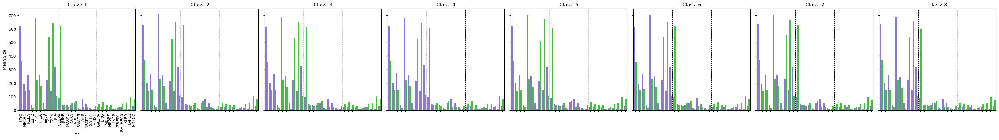

In [35]:
# Melt df_results_sorted for the sizes
df_melted_size = pd.melt(df_results_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['size_collectri_mean', 'size_dorothea_mean'], 
                    var_name='dataset', value_name='median_size')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_size.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='median_size', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 750])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Size')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

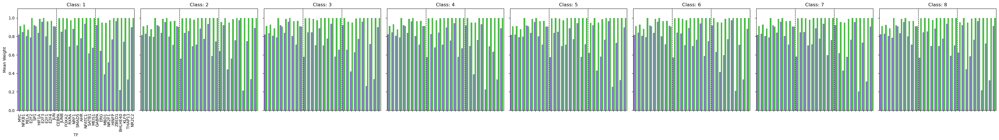

In [36]:
# Melt df_results_sorted for the sizes
df_melted_weight = pd.melt(df_results_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['weight_collectri_mean', 'weight_dorothea_mean'], 
                    var_name='dataset', value_name='mean_weight')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_weight.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_weight', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 1.1])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Weight')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

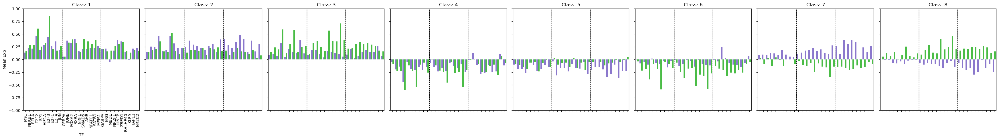

In [37]:
# Melt df_results_sorted for the sizes
df_melted_mean = pd.melt(df_results_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['mean_collectri_mean', 'mean_dorothea_mean'], 
                    var_name='dataset', value_name='mean_expression')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_mean.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_expression', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([-1, 1])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Exp')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()


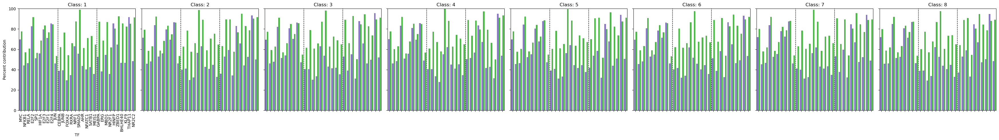

In [70]:
# Melt df_results_sorted for the sizes
df_melted_contribute = pd.melt(df_results_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['contribute_collectri_mean', 'contribute_dorothea_mean'], 
                    var_name='dataset', value_name='mean_contribute')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_contribute.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_contribute', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 100])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Percent contribution')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

#### Plot All population - Scatter between Mean and ULM

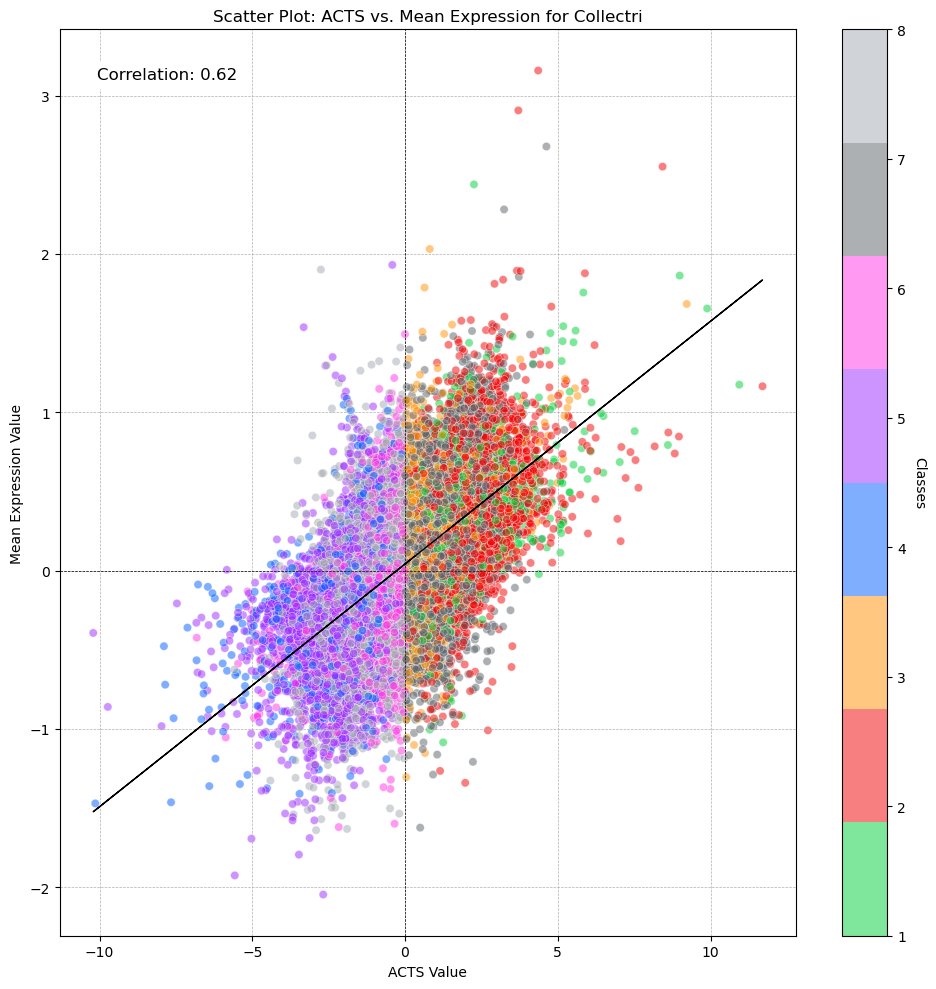

In [38]:
# CollecTRI Mean VS ulm

# Assuming df_collectri_acts_filtered, df_collectri_mean, and df_classes have been properly defined and populated
x_values = df_collectri_acts_filtered.values.flatten()
y_values = df_collectri_mean.values.flatten()
colors = df_classes.values.flatten()

# Calculate the correlation coefficient
correlation = np.corrcoef(x_values, y_values)[0, 1]

# Calculate the coefficients of the line of best fit
slope, intercept = np.polyfit(x_values, y_values, 1)

# Generate y-values for the line of best fit
line_y = slope * np.array(x_values) + intercept

# Define the color map
cmap = ListedColormap(["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"])

# Create scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(x_values, y_values, c=colors, cmap=cmap, alpha=0.5, edgecolors="w", linewidth=0.5)

# Plot the line of best fit
plt.plot(x_values, line_y, color='black', linewidth=1)

# Create a colorbar with proper ticks and labels
cbar = plt.colorbar(scatter, ticks=np.arange(1, 9))
cbar.set_label('Classes', rotation=270, labelpad=15)

plt.xlabel('ACTS Value')
plt.ylabel('Mean Expression Value')
plt.title('Scatter Plot: ACTS vs. Mean Expression for Collectri')

# Annotate the correlation coefficient on the plot
plt.annotate(f'Correlation: {correlation:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='center', fontsize=12, backgroundcolor='white')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.5)
plt.axvline(x=0, color='k', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


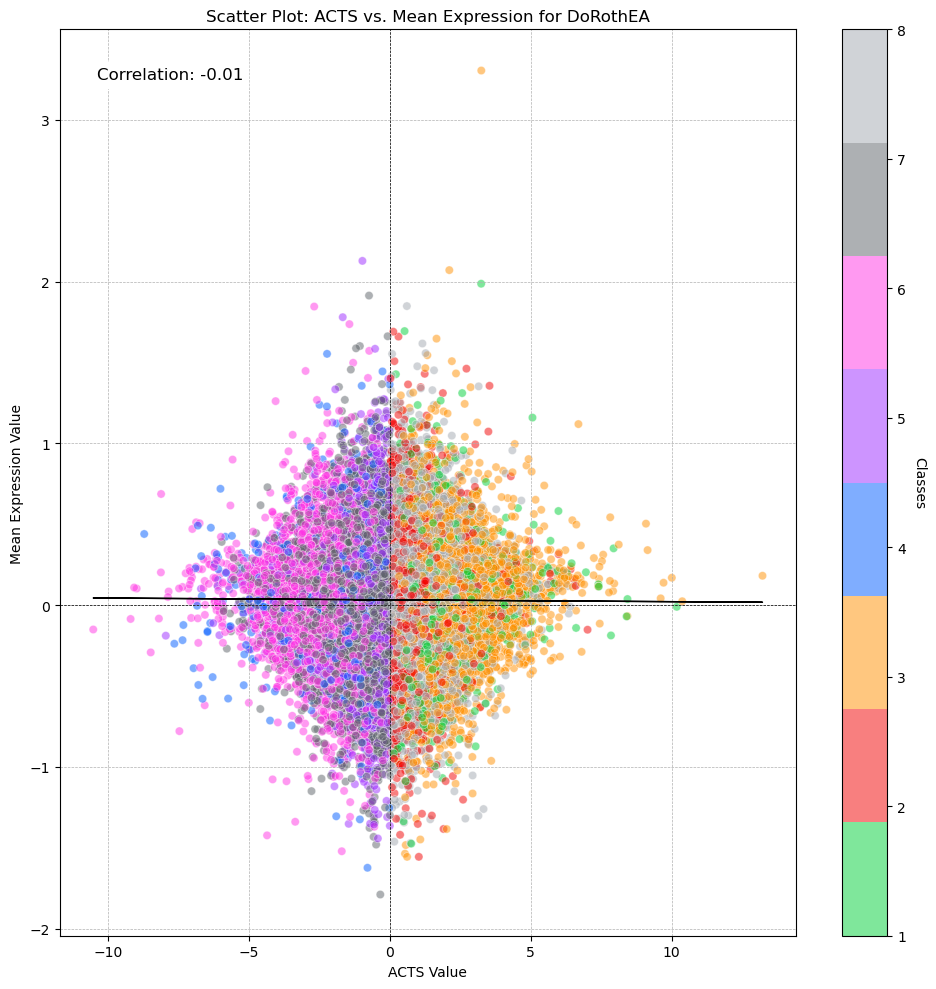

In [39]:
# DoRothEA Mean VS ulm

# Assuming df_dorothea_acts_filtered, df_dorothea_mean, and df_classes have been properly defined and populated
x_values = df_dorothea_acts_filtered.values.flatten()
y_values = df_dorothea_mean.values.flatten()
colors = df_classes.values.flatten()

# Calculate the correlation coefficient
correlation = np.corrcoef(x_values, y_values)[0, 1]

# Calculate the coefficients of the line of best fit
slope, intercept = np.polyfit(x_values, y_values, 1)

# Generate y-values for the line of best fit
line_y = slope * np.array(x_values) + intercept

# Define the color map
cmap = ListedColormap(["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"])

# Create scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(x_values, y_values, c=colors, cmap=cmap, alpha=0.5, edgecolors="w", linewidth=0.5)

# Plot the line of best fit
plt.plot(x_values, line_y, color='black', linewidth=1)

# Create a colorbar with proper ticks and labels
cbar = plt.colorbar(scatter, ticks=np.arange(1, 9))
cbar.set_label('Classes', rotation=270, labelpad=15)

plt.xlabel('ACTS Value')
plt.ylabel('Mean Expression Value')
plt.title('Scatter Plot: ACTS vs. Mean Expression for DoRothEA')

# Annotate the correlation coefficient on the plot
plt.annotate(f'Correlation: {correlation:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='center', fontsize=12, backgroundcolor='white')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.5)
plt.axvline(x=0, color='k', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


#### Plot All population - Scatter  TF between CollecTRI and DoRothEA using Mean

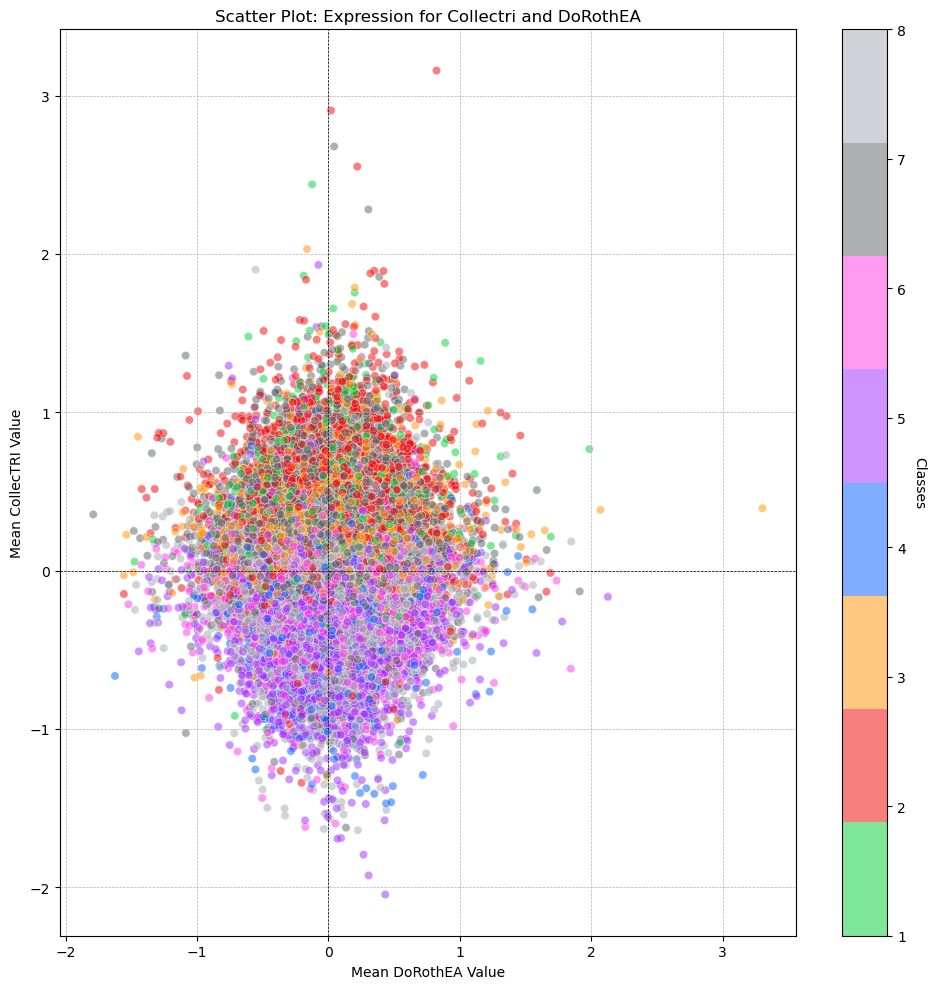

In [40]:
x_values = df_dorothea_mean.values.flatten()
y_values = df_collectri_mean.values.flatten()
colors = df_classes.values.flatten()


# Define the color map
cmap = ListedColormap(["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"])

# Create scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(x_values, y_values, c=colors, cmap=cmap, alpha=0.5, edgecolors="w", linewidth=0.5)

# Create a colorbar with proper ticks and labels
cbar = plt.colorbar(scatter, ticks=np.arange(1, 9))
cbar.set_label('Classes', rotation=270, labelpad=15)

plt.xlabel('Mean DoRothEA Value')
plt.ylabel('Mean CollecTRI Value')
plt.title('Scatter Plot: Expression for Collectri and DoRothEA')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.5)
plt.axvline(x=0, color='k', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

#### Plot All population - Summarize TF count using Mean

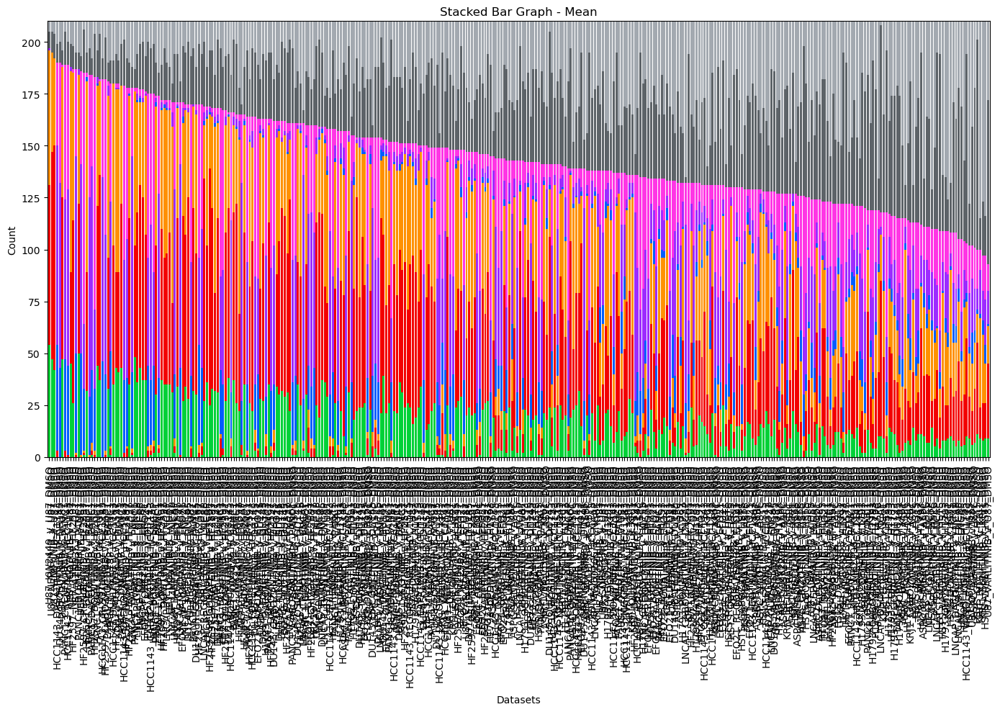

In [41]:
# Plot Summarize TF count by Datasets
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Plotting the stacked bar graph
ax = df_classes_summary_mean_sorted.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Stacked Bar Graph - Mean")
ax.set_ylabel("Count")
ax.set_xlabel("Datasets")
ax.set_ylim([0, 210])

plt.tight_layout()
plt.show()


#### Plot All population - Correlation between CollecTRI and DoRothEA

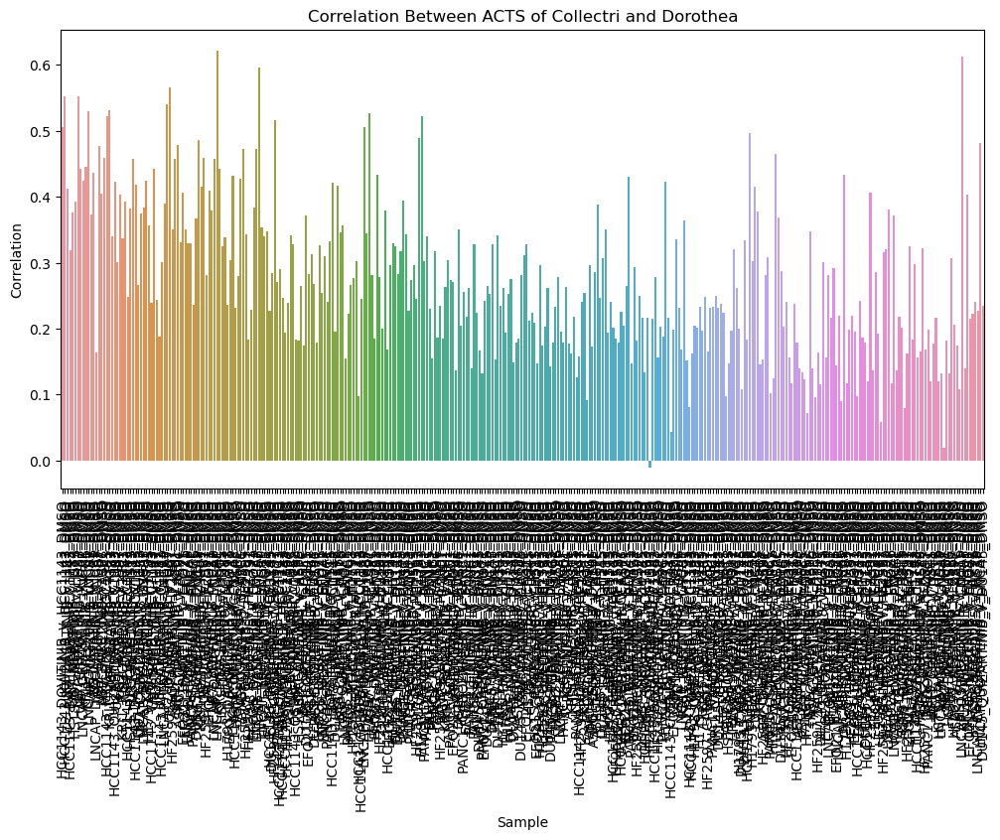

In [42]:
# Calculate correlation for each sample
correlations = df_collectri_acts_filtered.apply(lambda x: x.corr(df_dorothea_acts_filtered.loc[x.name]), axis=1)

# Create a new dataframe for correlations
df_correlation_acts = pd.DataFrame(correlations, columns=['correlation'])

# Assuming 'df_classes_summary_sorted' has an index that matches with the samples in df_correlation_acts
df_correlation_acts_sorted = df_correlation_acts.loc[df_classes_summary_sorted.index]

# Bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=df_correlation_acts_sorted.index, y=df_correlation_acts_sorted['correlation'])
plt.xticks(rotation=90)  # Rotate labels for better readability
plt.xlabel('Sample')
plt.ylabel('Correlation')
plt.title('Correlation Between ACTS of Collectri and Dorothea')
plt.show()

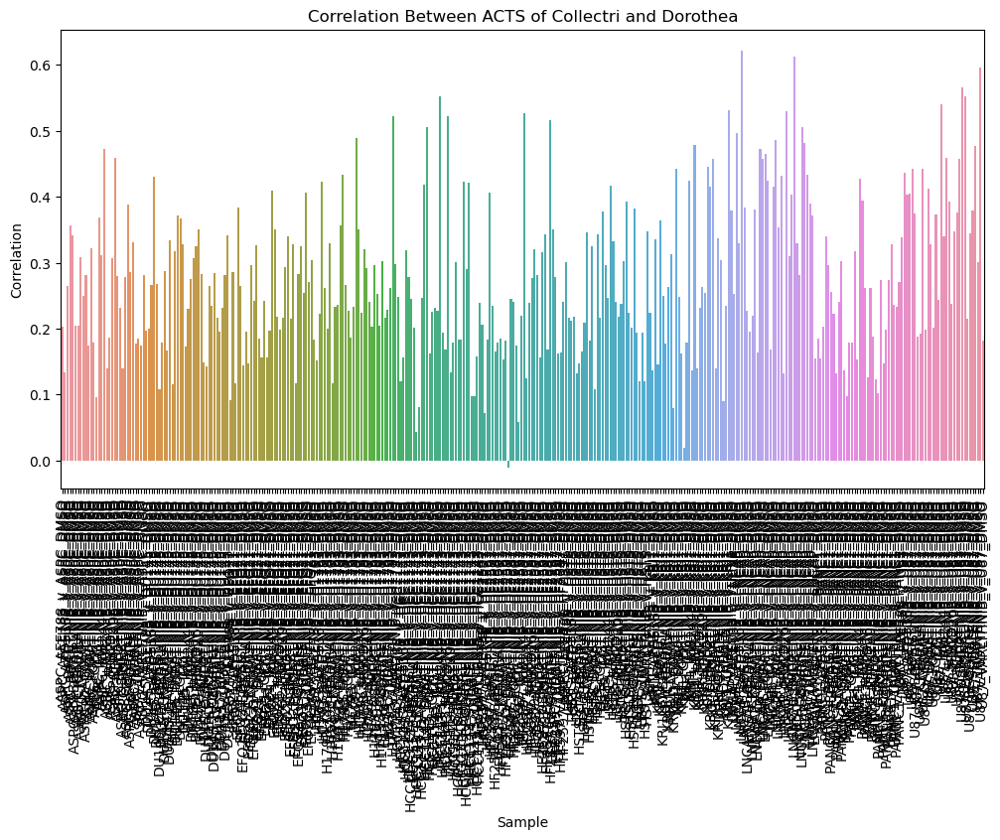

In [43]:
# Calculate correlation for each sample
correlations = df_collectri_acts_filtered.apply(lambda x: x.corr(df_dorothea_acts_filtered.loc[x.name]), axis=1)

# Create a new dataframe for correlations
df_correlation_acts = pd.DataFrame(correlations, columns=['correlation'])

def sort_key(index_str):
    """
    Extracts cell_line and drug from the index string and returns a tuple
    for sorting purposes.
    """
    parts = index_str.split('_')
    cell_line = parts[0]
    drug = parts[1]
    return (cell_line, drug)

# Sort the index based on the cell line and drug
sorted_index = sorted(df_correlation_acts.index, key=sort_key)

# Reindex the dataframe based on the sorted index
df_correlation_acts_sorted = df_correlation_acts.reindex(sorted_index)

# Bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=df_correlation_acts_sorted.index, y=df_correlation_acts_sorted['correlation'])
plt.xticks(rotation=90)  # Rotate labels for better readability
plt.xlabel('Sample')
plt.ylabel('Correlation')
plt.title('Correlation Between ACTS of Collectri and Dorothea')
plt.show()


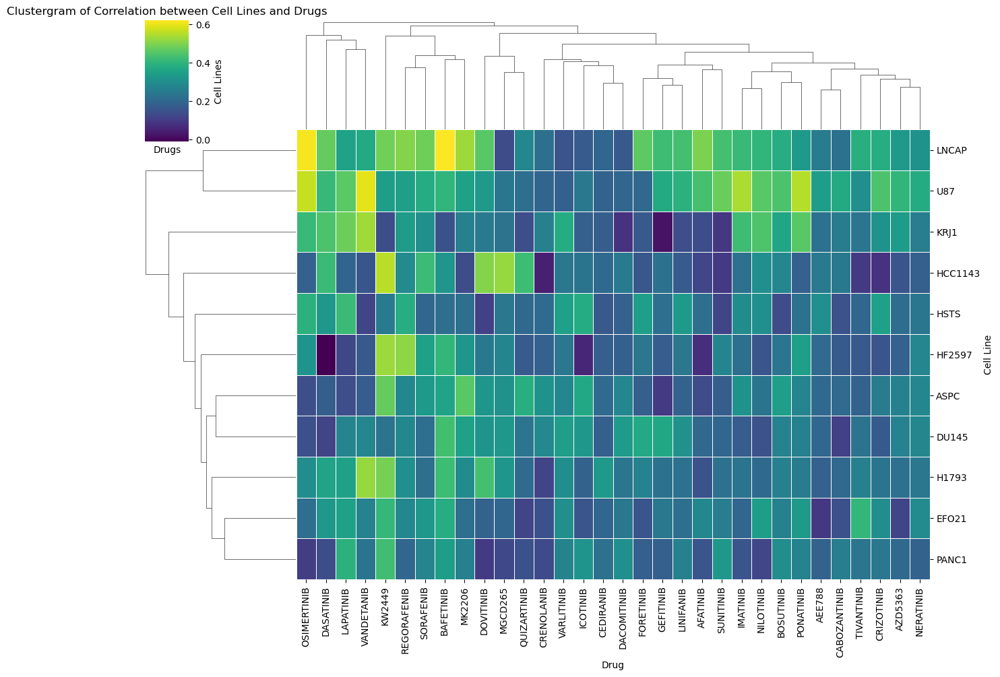

In [44]:
# Example index format: "<cell_line>_<drug>_v_<cell_line>_DMSO"
# Extract cell_line and drug

# Split the index
split_index = df_correlation_acts_sorted.index.str.split('_')

# Cell line is the first part
cell_lines = [i[0] for i in split_index]

# Drug is the second part; concatenate further parts if necessary (until '_v')
drugs = ['_'.join(i[1:i.index('v')]) for i in split_index]

# Create a new DataFrame with a MultiIndex
multi_index_df = pd.DataFrame(df_correlation_acts_sorted['correlation'].values, index=[cell_lines, drugs], columns=['correlation'])

# Convert the MultiIndex DataFrame to a pivot table
pivot_df = multi_index_df.reset_index()
pivot_df.columns = ['Cell Line', 'Drug', 'Correlation']

# Pivot the DataFrame
pivot_table = pivot_df.pivot(index='Cell Line', columns='Drug', values='Correlation')

# Create the clustermap with the inverted viridis colormap
sns.clustermap(pivot_table, figsize=(13, 10), cmap='viridis', linewidths=.5, annot=False)

# Enhance the plot if needed
plt.title('Clustergram of Correlation between Cell Lines and Drugs')
plt.xlabel('Drugs')
plt.ylabel('Cell Lines')
plt.show()



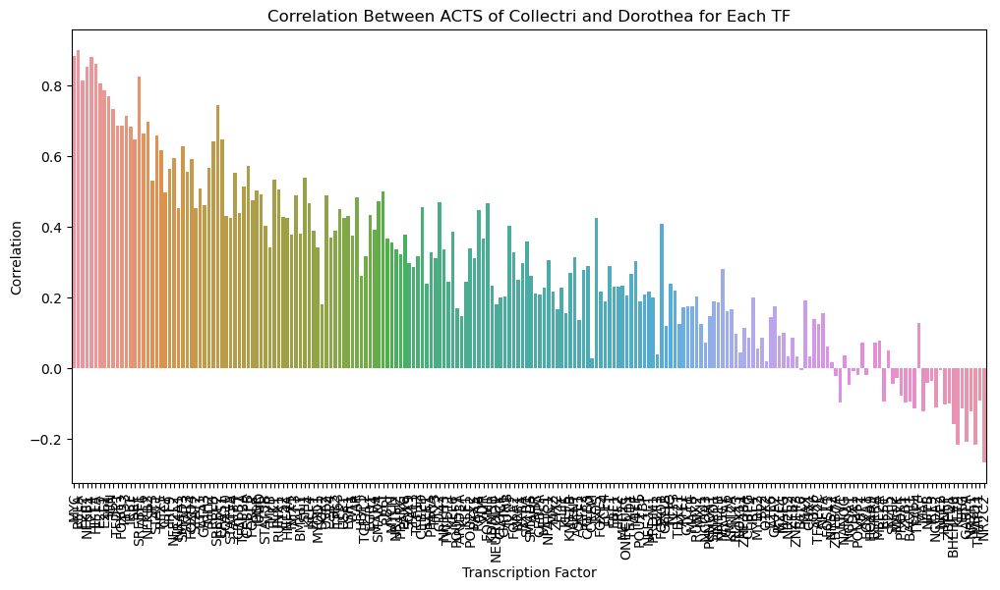

In [45]:
# Calculate correlation for each TF (column-wise)
correlations_tf = df_collectri_acts_filtered.apply(lambda x: x.corr(df_dorothea_acts_filtered[x.name]), axis=0)

# Create a new dataframe for TF correlations
df_tf_correlation_acts = pd.DataFrame(correlations_tf, columns=['correlation'])

# # Sort the DataFrame if necessary
# df_tf_correlation_acts_sorted = df_tf_correlation_acts.sort_index()

# Assuming 'df_classes_summary_sorted' has an index that matches with the samples in df_correlation_acts
df_tf_correlation_acts_sorted = df_tf_correlation_acts.loc[df_classes_summary_sorted_cols.index]


# Bar plot for TF correlations
plt.figure(figsize=(12, 6))
sns.barplot(x=df_tf_correlation_acts_sorted.index, y=df_tf_correlation_acts_sorted['correlation'])
plt.xticks(rotation=90)  # Rotate labels for better readability
plt.xlabel('Transcription Factor')
plt.ylabel('Correlation')
plt.title('Correlation Between ACTS of Collectri and Dorothea for Each TF')
plt.show()


#### Plot Significant population - Summarize TF count

In [46]:
df_collectri_pvals_classes = (
    df_classes
    .where(df_collectri_pvals_filtered >= 0.5, 0)
    .apply(lambda row: row.value_counts(), axis=1)
    .fillna(0)
    .astype(int)
    .drop(columns=[0])
    .loc[df_classes_summary_sorted.index]
)

df_dorothea_pvals_classes = (
    df_classes
    .where(df_dorothea_pvals_filtered >= 0.5, 0)
    .apply(lambda row: row.value_counts(), axis=1)
    .fillna(0)
    .astype(int)
    .drop(columns=[0])
    .loc[df_classes_summary_sorted.index]
)

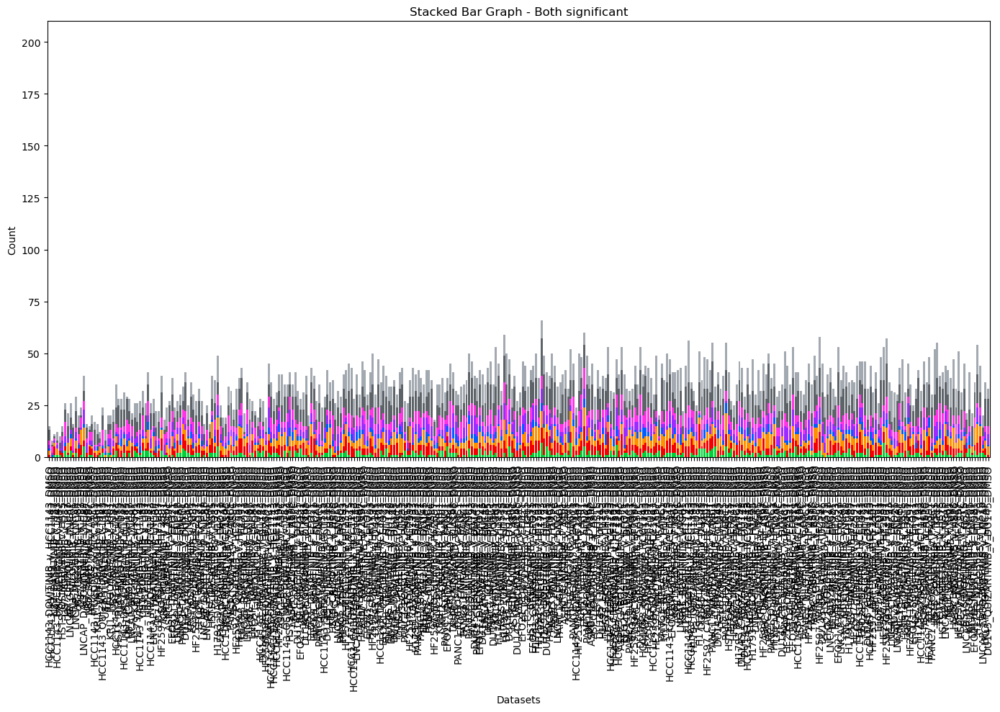

In [47]:
# Summarize TF count by Datasets
# Set classes to 0 where p-values are less than 0.5
# Both Significant
df_both_pvals_classes = (
    df_classes
    .where((df_collectri_pvals_filtered >= 0.5) & (df_dorothea_pvals_filtered >= 0.5), 0)
    .apply(lambda row: row.value_counts(), axis=1)
    .fillna(0)
    .astype(int)
    .drop(columns=[0])
    .loc[df_classes_summary_sorted.index]
)

# Plot Summarize TF count by Datasets - Both
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Plotting the stacked bar graph
ax = df_both_pvals_classes.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Stacked Bar Graph - Both significant")
ax.set_ylabel("Count")
ax.set_xlabel("Datasets")
ax.set_ylim([0, 210])

plt.tight_layout()
plt.show()

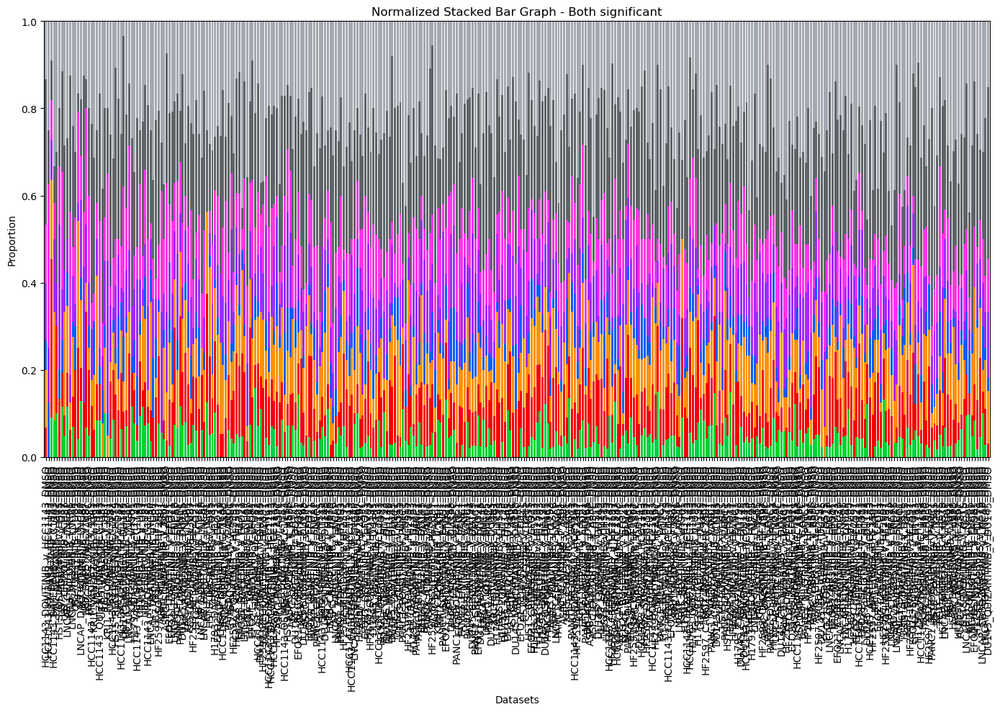

In [48]:
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Copy the dataframe and drop the 'Group' column
df_for_normalization = df_both_pvals_classes.drop(columns='Group', errors='ignore').copy()

# Normalize the data by dividing by the sum across the row
df_normalized = df_for_normalization.div(df_both_pvals_classes.sum(axis=1), axis=0)

# Plotting the normalized stacked bar graph
ax = df_normalized.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Normalized Stacked Bar Graph - Both significant")
ax.set_ylabel("Proportion")
ax.set_xlabel("Datasets")
ax.set_ylim([0, 1])  # Set y-axis scale to 0-1 for normalized data

plt.tight_layout()
plt.show()

In [49]:
df_collectri_pvals_classes_cols = (
    df_classes
    .where(df_collectri_pvals_filtered >= 0.5, 0)
    .apply(lambda col: col.value_counts(), axis=0)
    .fillna(0)
    .astype(int)
    .T
    .drop(columns=[0])
    .loc[df_classes_summary_sorted_cols.index]
)

df_dorothea_pvals_classes_cols = (
    df_classes
    .where(df_dorothea_pvals_filtered >= 0.5, 0)
    .apply(lambda col: col.value_counts(), axis=0)
    .fillna(0)
    .astype(int)
    .T
    .drop(columns=[0])
    .loc[df_classes_summary_sorted_cols.index]
)

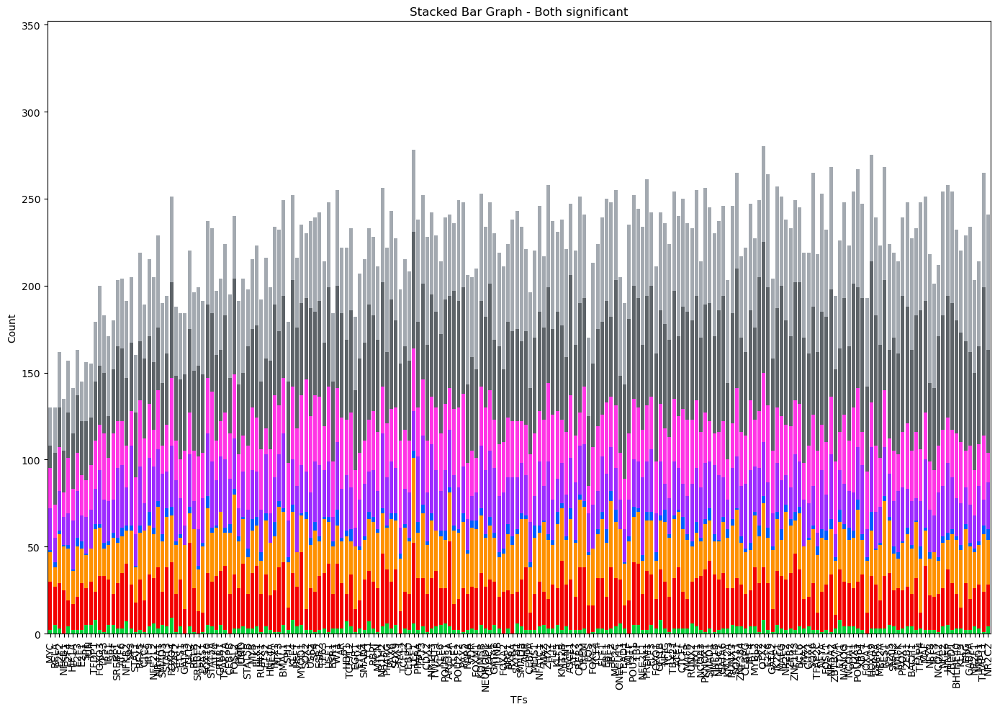

In [50]:
# Summarize TF count by TF names
# Set classes to 0 where p-values are less than 0.5
df_both_pvals_classes_cols = (
    df_classes
    .where((df_collectri_pvals_filtered >= 0.5) | (df_dorothea_pvals_filtered >= 0.5), 0)
    .apply(lambda col: col.value_counts(), axis=0)
    .fillna(0)
    .astype(int)
    .T
    .drop(columns=[0])
    .loc[df_classes_summary_sorted_cols.index]
)

# Plot Summarize TF count by TF Names - Both
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Plotting the stacked bar graph
ax = df_both_pvals_classes_cols.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Stacked Bar Graph - Both significant")
ax.set_ylabel("Count")
ax.set_xlabel("TFs")
ax.set_ylim([0, 352])

plt.tight_layout()
plt.show()

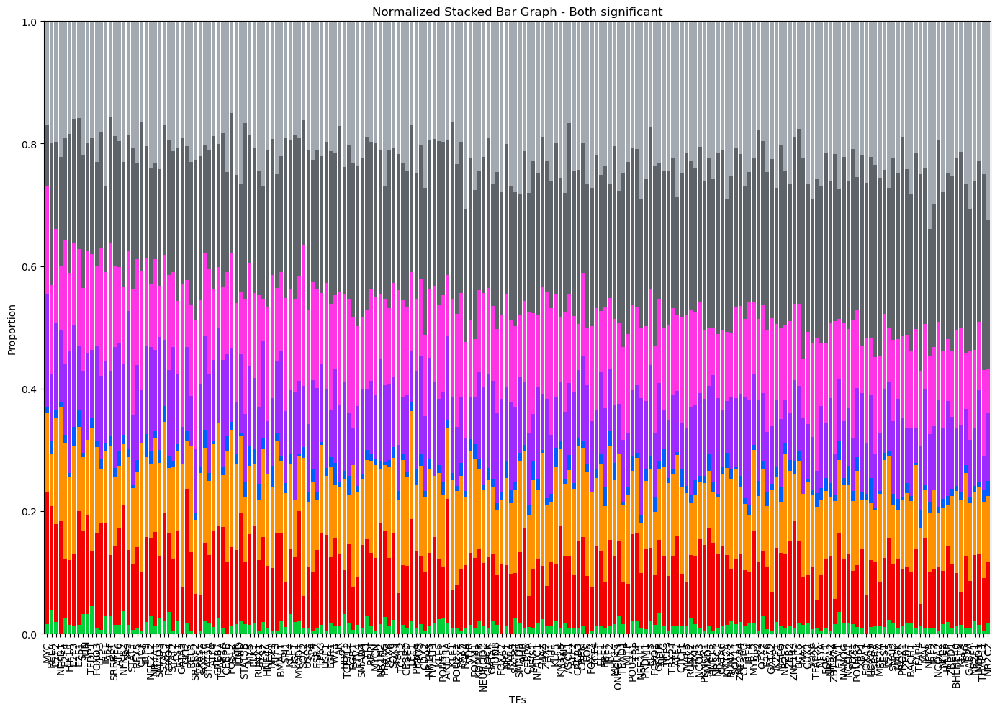

In [51]:
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Copy the dataframe and drop the 'Group' column
df_for_normalization = df_both_pvals_classes_cols.drop(columns='Group', errors='ignore').copy()

# Normalize the data by dividing by the sum across the row
df_normalized = df_for_normalization.div(df_both_pvals_classes_cols.sum(axis=1), axis=0)

# Plotting the normalized stacked bar graph
ax = df_normalized.plot(kind='bar', stacked=True, figsize=(14, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Normalized Stacked Bar Graph - Both significant")
ax.set_ylabel("Proportion")
ax.set_xlabel("TFs")
ax.set_ylim([0, 1])  # Set y-axis scale to 0-1 for normalized data

plt.tight_layout()
plt.show()

#### Plot Significant population - Scatter TF between CollecTRI and DoRothEA

In [52]:
# Create df_classes_sig with 0 for non-significant
df_classes_sig = pd.DataFrame(0, index=df_collectri_pvals_filtered.index, columns=df_collectri_pvals_filtered.columns)

# Update values based on significance criteria
df_classes_sig[df_collectri_pvals_filtered < 0.25] = 1  # collectri significant only
df_classes_sig[df_dorothea_pvals_filtered < 0.25] = 2  # dorothea significant only
df_classes_sig[(df_collectri_pvals_filtered < 0.25) & (df_dorothea_pvals_filtered < 0.25)] = 3  # both significant

df_classes_sig

,AHR,AR,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,ATF6,...,WT1,XBP1,YY1,ZBED1,ZBTB7A,ZEB1,ZEB2,ZHX2,ZNF143,ZNF384
DU145_AZD5363_v_DU145_DMSO,2,0,3,2,1,0,2,3,2,2,...,1,1,2,1,0,2,0,1,2,2
PANC1_AFATINIB_v_PANC1_DMSO,0,2,1,0,2,2,0,1,0,1,...,0,1,1,0,3,2,0,0,0,3
HCC1143_TIVANTINIB_v_HCC1143_DMSO,3,0,1,3,0,0,0,0,3,3,...,1,1,2,0,2,0,2,0,2,2
PANC1_CRIZOTINIB_v_PANC1_DMSO,0,3,3,0,2,0,1,1,1,2,...,0,0,2,3,3,2,0,0,0,1
PANC1_MK2206_v_PANC1_DMSO,2,0,1,0,0,2,0,0,3,1,...,2,0,3,0,2,3,2,1,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U87_ICOTINIB_v_U87_DMSO,3,3,1,2,2,0,2,1,0,0,...,1,1,3,3,1,0,3,2,0,1
HCC1143_AZD5363_v_HCC1143_DMSO,0,1,1,0,0,2,2,2,1,1,...,1,0,2,0,0,0,2,2,2,3
HF2597_MK2206_v_HF2597_DMSO,3,0,1,0,3,2,2,1,2,1,...,0,1,1,1,1,1,1,0,0,3
PANC1_BOSUTINIB_v_PANC1_DMSO,2,3,0,2,0,0,0,2,0,1,...,0,1,0,2,2,2,1,1,0,3


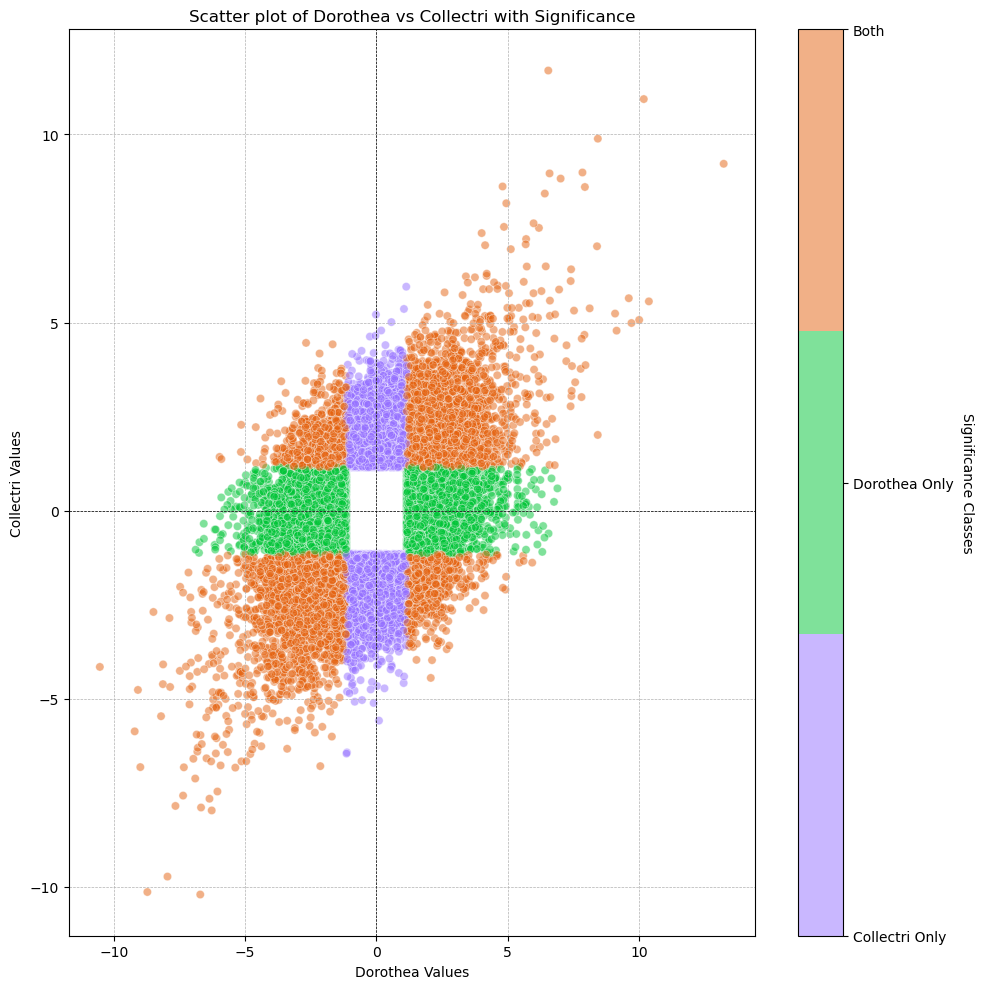

In [53]:
# Remove class 0 from the scatter plot data
mask = df_classes_sig != 0
x_values = df_dorothea_acts_filtered[mask].values.flatten()
y_values = df_collectri_acts_filtered[mask].values.flatten()
colors = df_classes_sig[mask].values.flatten()

# Define the color map
cmap = ListedColormap(["#9570FF", "#00C537", "#E56310"])  # Colors for classes 1, 2, 3

# Create scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(x_values, y_values, c=colors, cmap=cmap, alpha=0.5, edgecolors="w", linewidth=0.5)

# Create a colorbar with proper ticks and labels
cbar = plt.colorbar(scatter, ticks=[1, 2, 3])
cbar.set_label('Significance Classes', rotation=270, labelpad=15)
cbar.set_ticklabels(['Collectri Only', 'Dorothea Only', 'Both'])

plt.xlabel('Dorothea Values')
plt.ylabel('Collectri Values')
plt.title('Scatter plot of Dorothea vs Collectri with Significance')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.5)
plt.axvline(x=0, color='k', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


#### Plot Significant population - Scatter TF between CollecTRI and DoRothEA using Mean

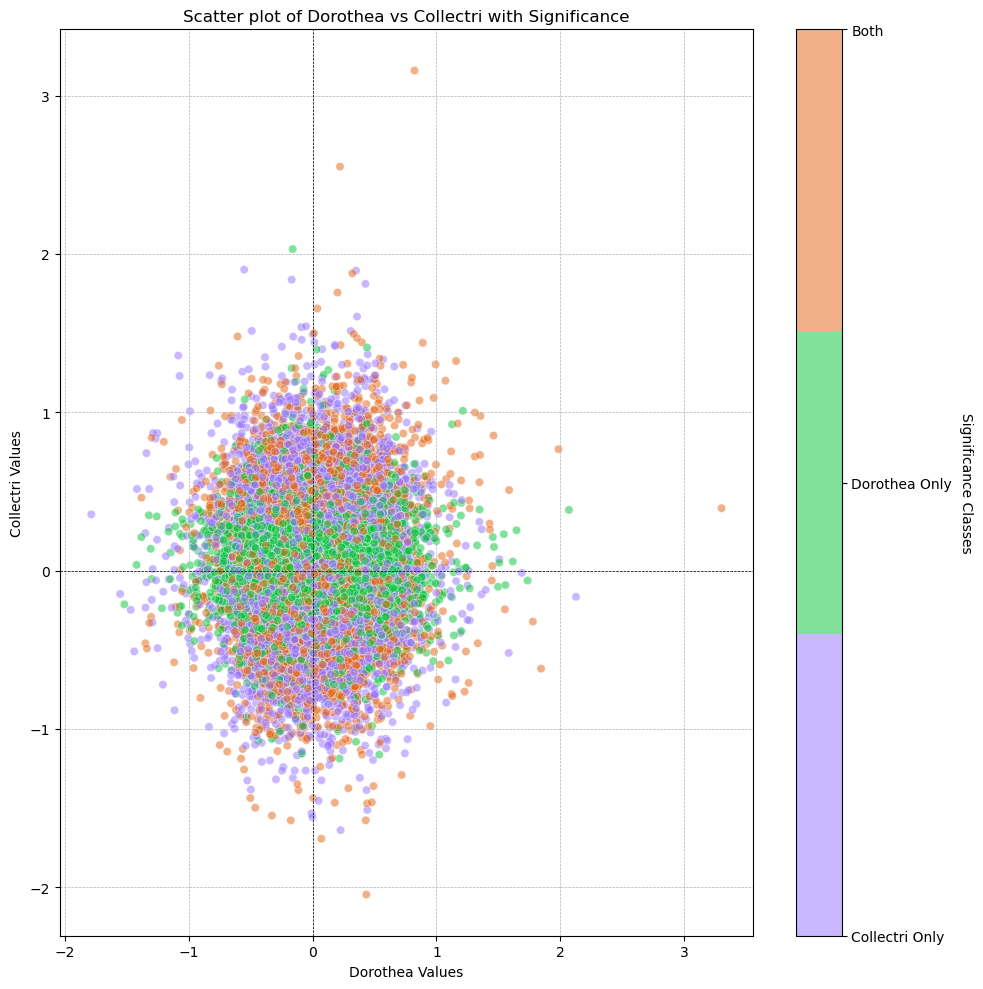

In [54]:
# Remove class 0 from the scatter plot data
mask = df_classes_sig != 0
x_values = df_dorothea_mean[mask].values.flatten()
y_values = df_collectri_mean[mask].values.flatten()
colors = df_classes_sig[mask].values.flatten()

# Define the color map
cmap = ListedColormap(["#9570FF", "#00C537", "#E56310"])  # Colors for classes 1, 2, 3

# Create scatter plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(x_values, y_values, c=colors, cmap=cmap, alpha=0.5, edgecolors="w", linewidth=0.5)

# Create a colorbar with proper ticks and labels
cbar = plt.colorbar(scatter, ticks=[1, 2, 3])
cbar.set_label('Significance Classes', rotation=270, labelpad=15)
cbar.set_ticklabels(['Collectri Only', 'Dorothea Only', 'Both'])

plt.xlabel('Dorothea Values')
plt.ylabel('Collectri Values')
plt.title('Scatter plot of Dorothea vs Collectri with Significance')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.5)
plt.axvline(x=0, color='k', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


#### Plot BoxPlot Compare between Significant and Non-significant of the TF count

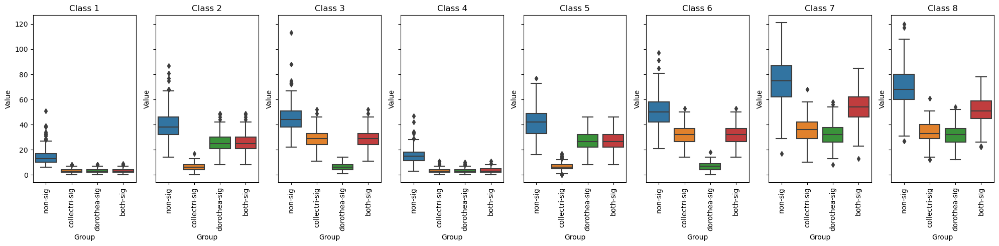

In [55]:
# Summarize TF count by TF Names
# Tagging and concatenating data
df_classes_summary_sorted_cols['Group'] = 'non-sig'
df_collectri_pvals_classes_cols['Group'] = 'collectri-sig'
df_dorothea_pvals_classes_cols['Group'] = 'dorothea-sig'
df_both_pvals_classes_cols['Group'] = 'both-sig'

df_combined = pd.concat([df_classes_summary_sorted_cols, df_collectri_pvals_classes_cols, 
                         df_dorothea_pvals_classes_cols, df_both_pvals_classes_cols])

# Melting for easier plotting
df_melted = df_combined.melt(id_vars=['Group'], var_name='Class', value_name='Value')

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(20, 5), sharey=True)

# Plotting each class in a subplot
for i, class_name in enumerate(df_combined.columns.drop('Group')):
    sns.boxplot(x='Group', y='Value', data=df_melted[df_melted['Class'] == class_name], ax=axes[i])
    axes[i].set_title(f'Class {class_name}')
    axes[i].set_xlabel('Group')
    axes[i].set_ylabel('Value')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# # Example for Wilcoxon test for Class 1 between non-sig and collectri-sig
# from scipy.stats import wilcoxon
# class_data = df_melted[df_melted['Class'] == 'Class1']
# non_sig_values = class_data[class_data['Group'] == 'non-sig']['Value']
# collectri_sig_values = class_data[class_data['Group'] == 'collectri-sig']['Value']

# stat, p = wilcoxon(non_sig_values, collectri_sig_values)
# print(f'Wilcoxon test for Class 1 (non-sig vs collectri-sig): stat={stat}, p-value={p}')

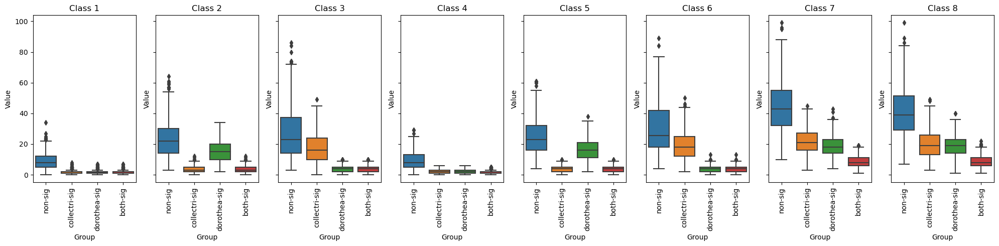

In [56]:
# Summarize TF count by Datasets
# Tagging and concatenating data
df_classes_summary_sorted['Group'] = 'non-sig'
df_collectri_pvals_classes['Group'] = 'collectri-sig'
df_dorothea_pvals_classes['Group'] = 'dorothea-sig'
df_both_pvals_classes['Group'] = 'both-sig'

df_combined = pd.concat([df_classes_summary_sorted, df_collectri_pvals_classes, 
                         df_dorothea_pvals_classes, df_both_pvals_classes])

# Melting for easier plotting
df_melted = df_combined.melt(id_vars=['Group'], var_name='Class', value_name='Value')

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(20, 5), sharey=True)

# Plotting each class in a subplot
for i, class_name in enumerate(df_combined.columns.drop('Group')):
    sns.boxplot(x='Group', y='Value', data=df_melted[df_melted['Class'] == class_name], ax=axes[i])
    axes[i].set_title(f'Class {class_name}')
    axes[i].set_xlabel('Group')
    axes[i].set_ylabel('Value')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

#### Plot Significant population - Jaccard Index, Size, Weight on TFs

In [57]:

df_both_pvals_classes_cols = (
    df_classes
    .where((df_collectri_pvals_filtered >= 0.5) | (df_dorothea_pvals_filtered >= 0.5), 0)
    .apply(lambda col: col.value_counts(), axis=0)
    .fillna(0)
    .astype(int)
    .T
    .drop(columns=[0])
    .loc[df_classes_summary_sorted_cols.index]
    .T
)

# # Summarize count of classes on each column
# df_classes_summary_cols = df_classes.apply(lambda col: col.value_counts(), axis=0).fillna(0).astype(int)

# Reorder columns from 1 to 8 and fill missing rows with zeros
df_both_pvals_classes_cols = df_both_pvals_classes_cols.reindex(index=range(1, 9), fill_value=0)

# Sorting based on three main groups
# m1 = df_classes_summary_cols.loc[1] + df_classes_summary_cols.loc[2] + df_classes_summary_cols.loc[3]
# m2 = df_classes_summary_cols.loc[4] + df_classes_summary_cols.loc[5] + df_classes_summary_cols.loc[6]
# m3 = df_classes_summary_cols.loc[7] + df_classes_summary_cols.loc[8]

# df_classes_summary_sorted_cols = df_classes_summary_cols.T.assign(m1=m1, m2=m2, m3=m3).sort_values(by=['m1', 'm2', 'm3'], ascending=[False, False, False]).drop(columns=['m1', 'm2', 'm3'])

m1 = df_both_pvals_classes_cols.loc[1] + df_both_pvals_classes_cols.loc[2] + df_both_pvals_classes_cols.loc[3] + df_both_pvals_classes_cols.loc[4] + df_both_pvals_classes_cols.loc[5] + df_both_pvals_classes_cols.loc[6]
m2 = df_both_pvals_classes_cols.loc[7] + df_both_pvals_classes_cols.loc[8]

df_both_pvals_classes_cols_sorted = df_both_pvals_classes_cols.T.assign(m1=m1, m2=m2).sort_values(by=['m1', 'm2'], ascending=[True, True]).drop(columns=['m1', 'm2'])

# df_classes_summary_sorted_cols = df_classes_summary_sorted_cols.T
df_both_pvals_classes_cols_sorted

,1,2,3,4,5,6,7,8
RELA,5,22,11,3,14,19,30,26
NFKB1,0,25,25,1,16,14,24,30
HIF1A,2,15,19,1,28,18,32,26
FOS,0,16,29,2,22,16,40,45
SP1,5,21,19,1,21,21,34,34
...,...,...,...,...,...,...,...,...
BMAL1,5,36,29,2,43,32,47,55
FOXO4,9,32,27,5,35,39,55,49
FOSL2,3,31,46,3,29,37,55,36
OTX2,8,30,37,4,31,40,75,55


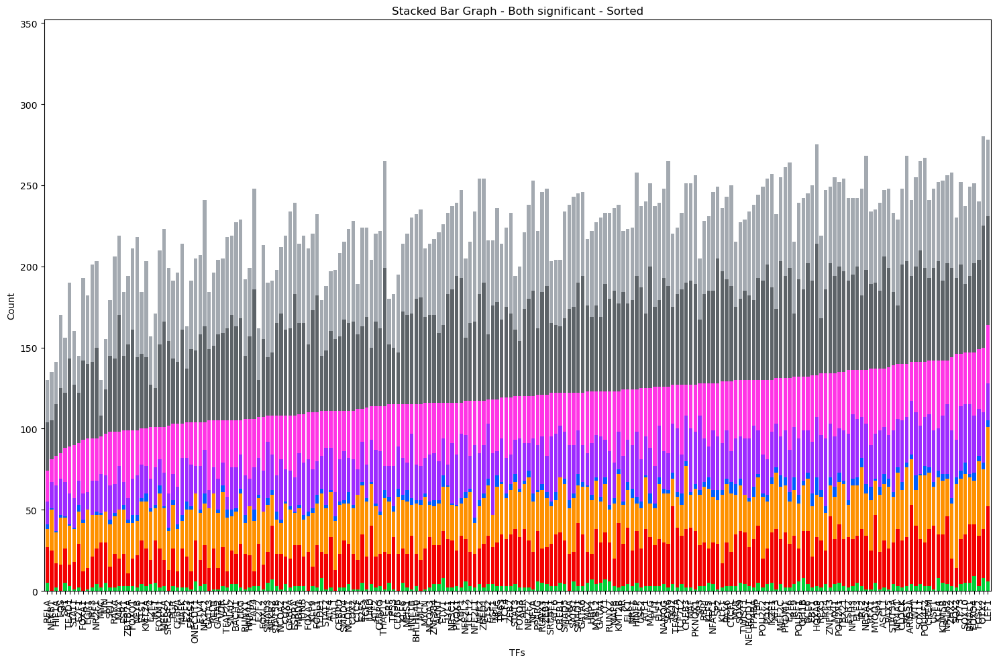

In [58]:
# Plot Summarize TF count by TF Names - Both
# Given color map
cmap = ["#00d138","#f30000","#ff9100","#005dff","#9d2bff","#ff35e5","#5d6368","#a3a9b0"]

# Plotting the stacked bar graph
ax = df_both_pvals_classes_cols_sorted.plot(kind='bar', stacked=True, figsize=(15, 10), width=0.8, color=cmap, legend=False)

# Setting some additional attributes to make the graph more readable
ax.set_title("Stacked Bar Graph - Both significant - Sorted")
ax.set_ylabel("Count")
ax.set_xlabel("TFs")
ax.set_ylim([0, 352])

plt.tight_layout()
plt.show()

In [71]:
# Filter only significant datasets
df_both_sig = df_classes.where((df_collectri_pvals_filtered >= 0.5) & (df_dorothea_pvals_filtered >= 0.5))

# Number of rows for selection
selected = 10

# Calculate the half index of the dataframe
half_index = len(df_both_pvals_classes_cols_sorted) // 2

# Adjust the indices for top, middle, and bottom selection based on the value of 'selected'
top_n = df_both_pvals_classes_cols_sorted.iloc[:selected].index.tolist()
middle_n = df_both_pvals_classes_cols_sorted.iloc[half_index - selected//2:half_index + selected//2].index.tolist()
bottom_n = df_both_pvals_classes_cols_sorted.iloc[-selected:].index.tolist()

# Define Jaccard Index function
def jaccard_index(set1, set2):
    intersection = len(set1 & set2)
    union = len(set1 | set2)
    return intersection / union if union != 0 else 0

def calculate_mean_expression(df_gse186341, tf_list, interaction_df):
    df_mean_expression = pd.DataFrame(index=df_gse186341.index)

    for tf in tf_list:
        # Filter interaction data for the current TF
        tf_data = interaction_df[interaction_df['source'] == tf]

        # Get targets and weights
        targets = tf_data['target'].tolist()
        weights = tf_data.set_index('target')['weight']

        # Keep only the targets that are present in df_gse186341
        available_targets = set(targets) & set(df_gse186341.columns)
        if not available_targets:
            # Skip this TF if none of its targets are present
            continue

        # # Subset and reindex weights to match available targets
        # weights = weights.reindex(available_targets)

        # # Filter df_gse186341 for the available targets and multiply by weights
        # weighted_exp = df_gse186341[list(available_targets)].multiply(weights, axis=1)

        # Filter df_gse186341 for the available targets and multiply by weights
        weighted_exp = df_gse186341[list(available_targets)]


        # Compute the mean expression per sample, ignoring NaNs
        mean_expression = weighted_exp.mean(axis=1, skipna=True)

        # Store in DataFrame
        df_mean_expression[tf] = mean_expression

    return df_mean_expression

# Calculate Jaccard Index and other metrics
results = []

for tf_list, name in zip([top_n, middle_n, bottom_n], ['top_n', 'middle_n', 'bottom_n']):
    for tf in tf_list:
        for class_num in range(1, 9):
            datasets = df_both_sig[df_both_sig[tf] == class_num].index
            jaccard_values = []
            size_collectri = []
            size_dorothea = []
            weight_collectri = []
            weight_dorothea = []
            mean_collectri = []
            mean_dorothea = []
            contribute_collectri = []
            contribute_dorothea = []
            for dataset in datasets:
                columns_of_interest = df_gse186341[df_gse186341.index == dataset].dropna(axis=1).columns
                collectri_filtered = collectri[collectri['source'] == tf]
                dorothea_filtered = dorothea[dorothea['source'] == tf]

                targets_collectri = set(collectri_filtered['target'].tolist()) & set(columns_of_interest)
                targets_dorothea = set(dorothea_filtered['target'].tolist()) & set(columns_of_interest)

                jaccard_values.append(jaccard_index(targets_collectri, targets_dorothea))
                size_collectri.append(len(targets_collectri))
                size_dorothea.append(len(targets_dorothea))
                contribute_collectri.append(len(set(targets_collectri)) / len(set(collectri_filtered['target'].tolist())) * 100)
                contribute_dorothea.append(len(set(targets_dorothea)) / len(set(dorothea_filtered['target'].tolist())) * 100)

                weight_collectri.extend(collectri_filtered[collectri_filtered['target'].isin(targets_collectri)]['weight'])
                weight_dorothea.extend(dorothea_filtered[dorothea_filtered['target'].isin(targets_dorothea)]['weight'])

                mean_collectri.append(calculate_mean_expression(
                    df_gse186341.loc[[dataset]], 
                    [tf], 
                    collectri
                ).mean().values[0])

                mean_dorothea.append(calculate_mean_expression(
                    df_gse186341.loc[[dataset]], 
                    [tf], 
                    dorothea
                ).mean().values[0])

            mean_jaccard = np.mean(jaccard_values) if jaccard_values else 0
            size_collectri_mean = np.mean(size_collectri) if size_collectri else 0
            size_dorothea_mean = np.mean(size_dorothea) if size_dorothea else 0
            contribute_collectri_mean = np.mean(contribute_collectri) if contribute_collectri else 0
            contribute_dorothea_mean = np.mean(contribute_dorothea) if contribute_dorothea else 0
            weight_collectri_mean = np.mean(weight_collectri) if weight_collectri else 0
            weight_dorothea_mean = np.mean(weight_dorothea) if weight_dorothea else 0
            mean_collectri_mean = np.mean(mean_collectri) if mean_collectri else 0
            mean_dorothea_mean = np.mean(mean_dorothea) if mean_dorothea else 0

            results.append({
                'tf_group': name,
                'tf': tf,
                'class': class_num,
                'size_collectri': size_collectri,
                'size_dorothea': size_dorothea,
                'jaccard_value': jaccard_values,
                'contribute_collectri': contribute_collectri,
                'contribute_dorothea': contribute_dorothea,
                'weight_collectri': weight_collectri,
                'weight_dorothea': weight_dorothea,
                'mean_collectri': mean_collectri,
                'mean_dorothea': mean_dorothea,
                'mean_jaccard': mean_jaccard,
                'size_collectri_mean': size_collectri_mean,
                'size_dorothea_mean': size_dorothea_mean,
                'contribute_collectri_mean': contribute_collectri_mean,
                'contribute_dorothea_mean': contribute_dorothea_mean,
                'weight_collectri_mean': weight_collectri_mean,
                'weight_dorothea_mean': weight_dorothea_mean,
                'mean_collectri_mean': mean_collectri_mean,
                'mean_dorothea_mean': mean_dorothea_mean
            })

# Convert results to dataframe for plotting
df_results_sig = pd.DataFrame(results)

# Sort results by mean_jaccard
df_results_sig_sorted = df_results_sig.sort_values(by=['tf_group','mean_jaccard'], ascending=[False,False])

df_results_sig_sorted


,tf_group,tf,class,size_collectri,size_dorothea,jaccard_value,contribute_collectri,contribute_dorothea,weight_collectri,weight_dorothea,...,mean_dorothea,mean_jaccard,size_collectri_mean,size_dorothea_mean,contribute_collectri_mean,contribute_dorothea_mean,weight_collectri_mean,weight_dorothea_mean,mean_collectri_mean,mean_dorothea_mean
9,top_n,NFKB1,2,"[189, 213, 190, 190, 191]","[153, 156, 142, 155, 142]","[0.3359375, 0.31316725978647686, 0.31746031746...","[43.648960739030024, 49.19168591224018, 43.879...","[61.199999999999996, 62.4, 56.8, 62.0, 56.8]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1,...","[1.0, 1.0, 1.0, -1.0, 1.0, 1.0, 1.0, 1.0, 1.0,...",...,"[0.1661994131621936, -0.1403559194815388, 0.13...",0.323996,194.600000,149.600000,44.942263,59.840000,0.849949,0.935829,0.042438,0.051511
15,top_n,NFKB1,8,"[180, 196, 177, 243, 243, 242]","[135, 148, 128, 173, 173, 172]","[0.30165289256198347, 0.31297709923664124, 0.2...","[41.570438799076214, 45.26558891454965, 40.877...","[54.0, 59.199999999999996, 51.2, 69.1999999999...","[1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1,...","[1.0, 1.0, -1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,...",...,"[-0.16738888445686745, 0.19789953467379082, 0....",0.315666,213.500000,154.833333,49.307159,61.933333,0.820453,0.924650,0.018889,0.073436
11,top_n,NFKB1,4,[196],[148],[0.31297709923664124],[45.26558891454965],[59.199999999999996],"[1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1,...","[1.0, 1.0, 1.0, 1.0, -1.0, 1.0, 1.0, 1.0, 1.0,...",...,[0.14702431769158603],0.312977,196.000000,148.000000,45.265589,59.200000,0.836735,0.932432,0.177653,0.147024
14,top_n,NFKB1,7,"[232, 181, 180, 190, 188]","[161, 128, 134, 142, 144]","[0.3187919463087248, 0.2821576763485477, 0.297...","[53.5796766743649, 41.801385681293304, 41.5704...","[64.4, 51.2, 53.6, 56.8, 57.599999999999994]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1,...","[1.0, 1.0, 1.0, 1.0, -1.0, 1.0, 1.0, 1.0, 1.0,...",...,"[0.14953724570259458, -0.186095350465422, 0.15...",0.309853,194.200000,141.800000,44.849885,56.720000,0.831102,0.923836,0.068143,-0.054918
10,top_n,NFKB1,3,"[231, 179]","[161, 134]","[0.31986531986531985, 0.2987551867219917]","[53.34872979214781, 41.339491916859124]","[64.4, 53.6]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1,...","[1.0, 1.0, 1.0, 1.0, -1.0, 1.0, 1.0, 1.0, 1.0,...",...,"[-0.1924673430035827, 0.251448693875727]",0.309310,205.000000,147.500000,47.344111,59.000000,0.834146,0.932203,0.055495,0.029491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,bottom_n,OTX2,4,"[14, 11, 6, 11]","[13, 11, 13, 10]","[0.0, 0.0, 0.0, 0.0]","[31.818181818181817, 25.0, 13.636363636363635,...","[54.166666666666664, 45.83333333333333, 54.166...","[1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.018369104003871338, -0.1543001647486997, -...",0.000000,10.500000,11.750000,23.863636,48.958333,0.904762,1.000000,-0.183889,-0.097956
228,bottom_n,OTX2,5,"[11, 10, 9, 16, 12, 7]","[11, 10, 9, 12, 12, 13]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[25.0, 22.727272727272727, 20.454545454545457,...","[45.83333333333333, 41.66666666666667, 37.5, 5...","[1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.1514078590327684, -0.16759137156272103, -0...",0.000000,10.833333,11.166667,24.621212,46.527778,0.907692,1.000000,-0.109962,-0.099771
229,bottom_n,OTX2,6,"[11, 7, 14, 14, 16, 10, 14, 11, 11]","[11, 13, 14, 14, 13, 10, 14, 10, 11]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[25.0, 15.909090909090908, 31.818181818181817,...","[45.83333333333333, 54.166666666666664, 58.333...","[1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,"[-0.07187887007787727, -0.00852046654832708, 0...",0.000000,12.000000,12.222222,27.272727,50.925926,0.870370,1.000000,0.025737,-0.077077
230,bottom_n,OTX2,7,"[10, 10, 12, 7, 12, 13, 11, 12, 12, 13, 13, 11...","

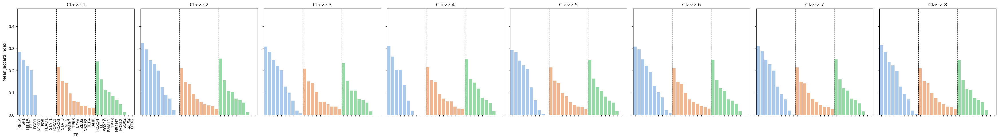

In [60]:
# Number of unique classes
num_classes = df_results_sig_sorted['class'].nunique()

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35,5))

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_results_sig_sorted.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_jaccard', hue='tf_group', ax=ax, dodge=False, palette="pastel")
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 0.48])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Jaccard Index')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks

    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')
plt.tight_layout()
plt.show()

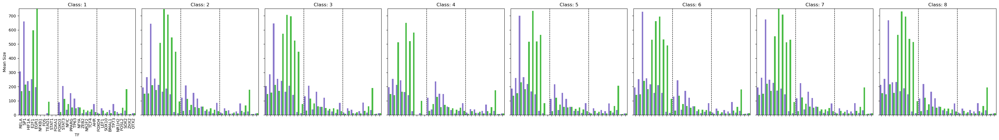

In [61]:
# Melt df_results_sorted for the sizes
df_melted_size = pd.melt(df_results_sig_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['size_collectri_mean', 'size_dorothea_mean'], 
                    var_name='dataset', value_name='median_size')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_size.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='median_size', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 750])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Size')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

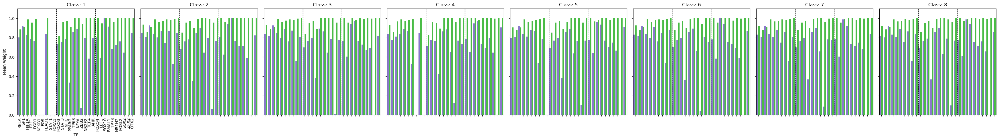

In [62]:
# Melt df_results_sorted for the sizes
df_melted_weight = pd.melt(df_results_sig_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['weight_collectri_mean', 'weight_dorothea_mean'], 
                    var_name='dataset', value_name='mean_weight')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_weight.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_weight', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 1.1])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Weight')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

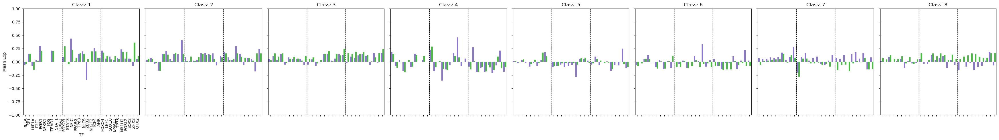

In [63]:
# Melt df_results_sorted for the sizes
df_melted_mean = pd.melt(df_results_sig_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['mean_collectri_mean', 'mean_dorothea_mean'], 
                    var_name='dataset', value_name='mean_expression')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_mean.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_expression', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([-1, 1])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Mean Exp')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()


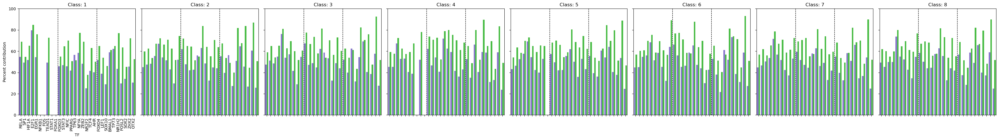

In [72]:
# Melt df_results_sorted for the sizes
df_melted_contribute = pd.melt(df_results_sig_sorted, id_vars=['tf', 'tf_group', 'class'], value_vars=['contribute_collectri_mean', 'contribute_dorothea_mean'], 
                    var_name='dataset', value_name='mean_contribute')

# Create a grid of plots
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(35, 5))

cmap = ["#836ada", "#38cf33"]

# Iterate through each class and plot
for i, (cls, grp) in enumerate(df_melted_contribute.groupby('class')):
    ax = axes[i]
    sns.barplot(data=grp, x='tf', y='mean_contribute', hue='dataset', ax=ax, palette=cmap)
    ax.set_title(f'Class: {cls}')
    ax.set_ylim([0, 100])

    # Only show x-axis labels and y-axis labels on the first plot
    if i != 0:
        ax.set_xlabel('')  # Remove the x-axis label
        ax.set_ylabel('')  # Remove the y-axis label
        ax.tick_params(labelbottom=False, labelleft=False)  # Remove the ticks
    else:
        ax.set_ylabel('Percent contribution')  # Only set for the first plot
        ax.set_xlabel('TF')  # Only set for the first plot

    ax.get_legend().remove()  # Remove the legend from all subplots
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for all x-ticks
    
    # Draw vertical lines on every 10 bars
    ax.axvline(x=9.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=19.5, color='black', linestyle='--', linewidth=1)

# # Add a legend outside the subplots
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), title='Dataset')

plt.tight_layout()
plt.show()

#### Plot Significant population - Clustergram between TFs and Samples

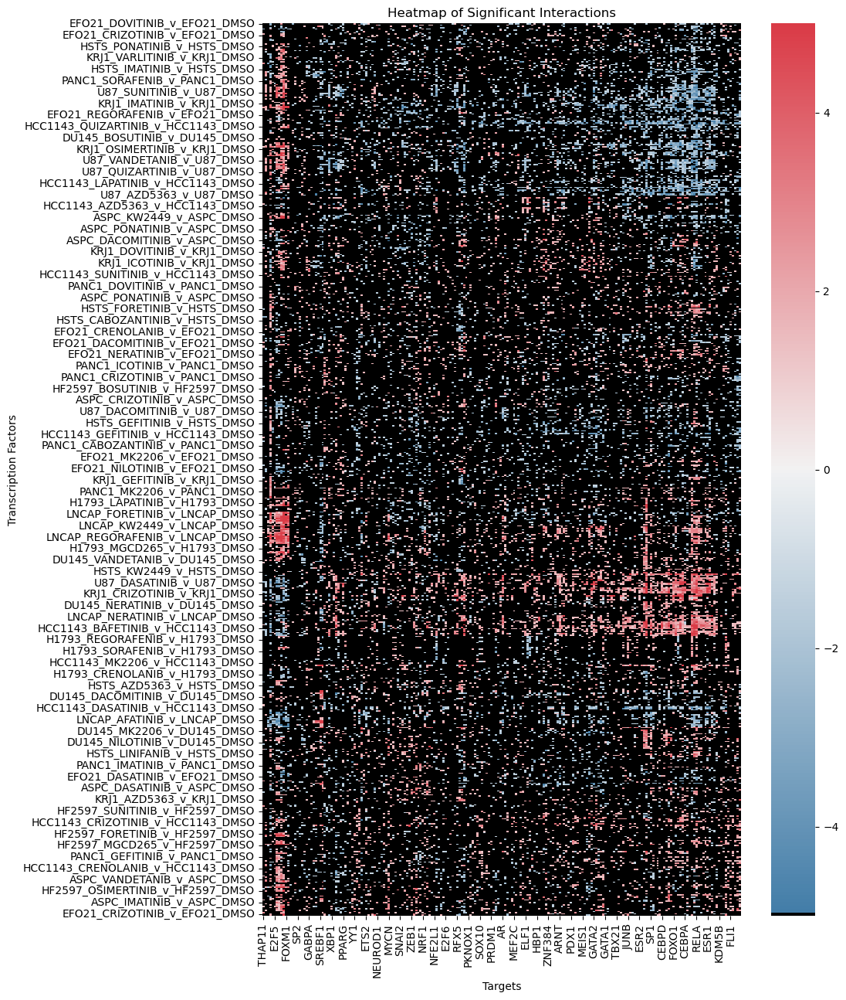

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

# Concatenate the original dataframes
df_collectri_acts_filtered_sorted['network'] = 'collectri'
df_dorothea_acts_filtered_sorted['network'] = 'dorothea'
combined_df = pd.concat([
    df_collectri_acts_filtered_sorted,
    df_dorothea_acts_filtered_sorted
], axis=0)

# Extract the 'network' column for row colors
row_colors = combined_df.pop('network').map({
    'collectri': "#836ada", 
    'dorothea': "#38cf33"
})

# Plot the original clustergram and capture the dendrogram order
clustergrid = sns.clustermap(combined_df, metric='correlation', method='average',
                             row_colors=row_colors, figsize=(10, 15), cmap='RdBu_r',
                             vmin=-5, vmax=5, cbar_pos=(0, 0.95, 0.05, 0.05))

# Capture the row and column order
row_order = clustergrid.dendrogram_row.reordered_ind
col_order = clustergrid.dendrogram_col.reordered_ind

plt.close()  # Close the original plot

# Mask non-significant values
extreme_value = -6
mask = df_classes_sig != 3  # Assuming class 3 is both-significant
df_collectri_acts_filtered_sorted_masked = df_collectri_acts_filtered_sorted.where(~mask, extreme_value)
df_dorothea_acts_filtered_sorted_masked = df_dorothea_acts_filtered_sorted.where(~mask, extreme_value)

# Reorder masked dataframes to match the original clustergram order
combined_masked_df = pd.concat([
    df_collectri_acts_filtered_sorted_masked,
    df_dorothea_acts_filtered_sorted_masked
], axis=0)

combined_masked_df_reordered = combined_masked_df.iloc[row_order, :]
combined_masked_df_reordered = combined_masked_df_reordered.iloc[:, col_order]

# Create a custom colormap with black for the extreme value and white at zero
cmap = sns.diverging_palette(240, 10, as_cmap=True)
newcolors = cmap(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
white = np.array([255/256, 255/256, 255/256, 1])

# Set black for extreme values and white for the center
midpoint = int(256 * (5 - extreme_value) / (10))  # Calculate the midpoint index
newcolors[:1, :] = black
newcolors[midpoint - 1:midpoint + 1, :] = white
newcmp = mcolors.ListedColormap(newcolors)

# Plot the heatmap with the reordered, masked data
plt.figure(figsize=(10, 15))
ax = sns.heatmap(combined_masked_df_reordered, cmap=newcmp, vmin=-5, vmax=5, center=0)
ax.set_title("Heatmap of Significant Interactions")
ax.set_xlabel("Targets")
ax.set_ylabel("Transcription Factors")

plt.show()


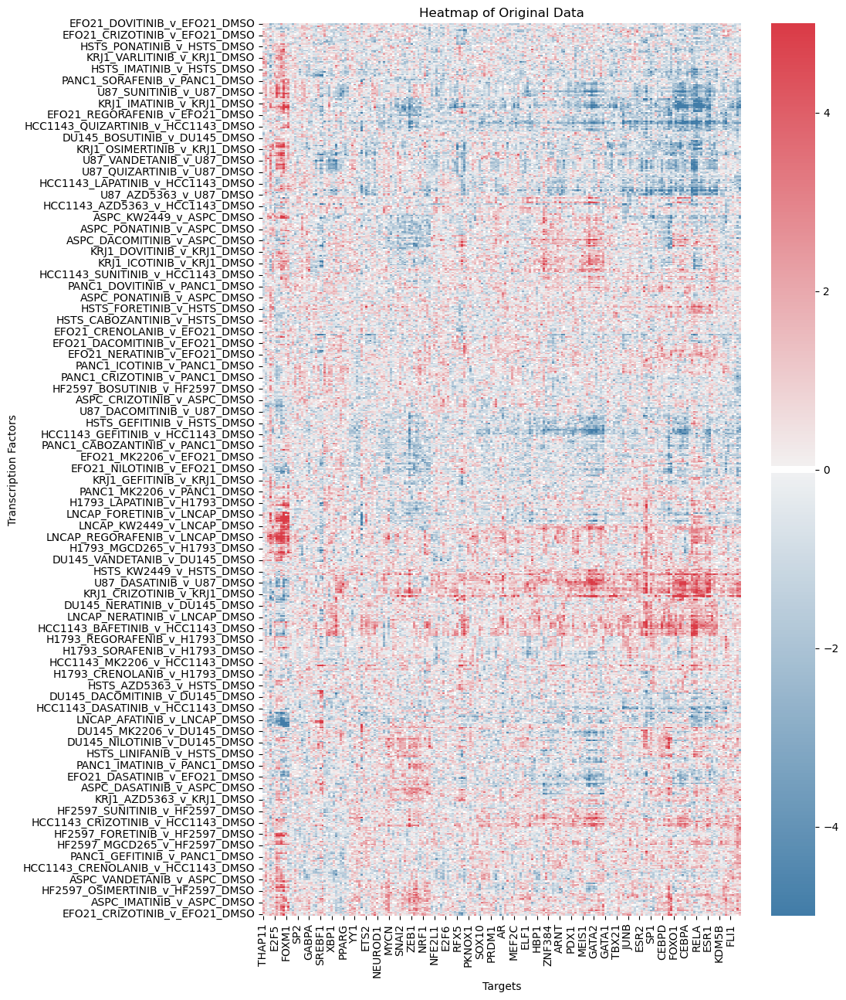

In [65]:
# Concatenate the original dataframes
df_collectri_acts_filtered_sorted['network'] = 'collectri'
df_dorothea_acts_filtered_sorted['network'] = 'dorothea'
combined_df = pd.concat([
    df_collectri_acts_filtered_sorted,
    df_dorothea_acts_filtered_sorted
], axis=0)

# Extract the 'network' column for row colors
row_colors = combined_df.pop('network').map({
    'collectri': "#836ada", 
    'dorothea': "#38cf33"
})

# Plot the original clustergram and capture the dendrogram order
clustergrid = sns.clustermap(combined_df, metric='correlation', method='average',
                             row_colors=row_colors, figsize=(10, 15), cmap='RdBu_r',
                             vmin=-5, vmax=5, cbar_pos=(0, 0.95, 0.05, 0.05))

# Capture the row and column order
row_order = clustergrid.dendrogram_row.reordered_ind
col_order = clustergrid.dendrogram_col.reordered_ind

plt.close()  # Close the original plot

# Reorder original dataframes to match the original clustergram order
combined_df_reordered = combined_df.iloc[row_order, :]
combined_df_reordered = combined_df_reordered.iloc[:, col_order]

# Create a custom colormap with white at zero
cmap = sns.diverging_palette(240, 10, as_cmap=True)
newcolors = cmap(np.linspace(0, 1, 256))
white = np.array([255/256, 255/256, 255/256, 1])

# Set white for the center
midpoint = 128  # Center index for 256 colors
newcolors[midpoint - 1:midpoint + 1, :] = white
newcmp = mcolors.ListedColormap(newcolors)

# Plot the heatmap with the reordered original data
plt.figure(figsize=(10, 15))
ax = sns.heatmap(combined_df_reordered, cmap=newcmp, vmin=-5, vmax=5, center=0)
ax.set_title("Heatmap of Original Data")
ax.set_xlabel("Targets")
ax.set_ylabel("Transcription Factors")

plt.show()


#### Plot Significant population - Correlation between CollecTRI and DoRothEA

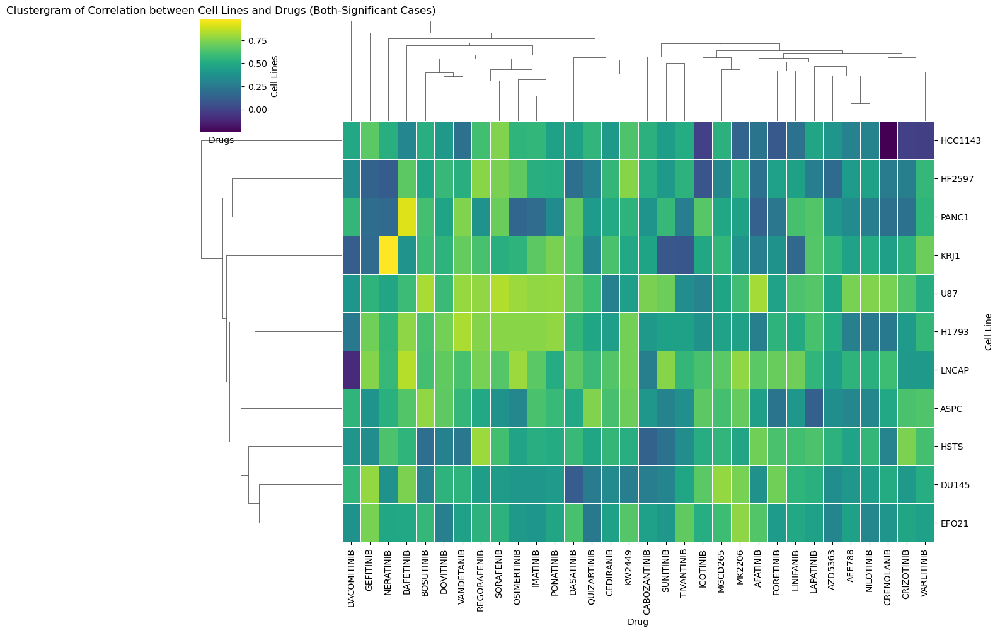

In [66]:
# Example index format: "<cell_line>_<drug>_v_<cell_line>_DMSO"
# Extract cell_line and drug
# Assuming class 3 in df_classes_sig indicates both-significant cases
both_sig_mask = df_classes_sig == 3

# Filter the activities dataframes for both-significant samples
df_collectri_acts_filtered_sig = df_collectri_acts_filtered[both_sig_mask]
df_dorothea_acts_filtered_sig = df_dorothea_acts_filtered[both_sig_mask]

# Calculate correlation for each sample, only for both-significant cases
correlations = df_collectri_acts_filtered_sig.apply(lambda x: x.corr(df_dorothea_acts_filtered_sig.loc[x.name]), axis=1)

# Create a new dataframe for correlations
df_correlation_acts = pd.DataFrame(correlations, columns=['correlation'])

# Assuming 'df_classes_summary_sorted' has an index that matches with the samples in df_correlation_acts
df_correlation_acts_sorted = df_correlation_acts.loc[df_classes_summary_sorted.index]

# Split the index
split_index = df_correlation_acts_sorted.index.str.split('_')

# Cell line is the first part
cell_lines = [i[0] for i in split_index]

# Drug is the second part; concatenate further parts if necessary (until '_v')
drugs = ['_'.join(i[1:i.index('v')]) for i in split_index]

# Create a new DataFrame with a MultiIndex
multi_index_df = pd.DataFrame(df_correlation_acts_sorted['correlation'].values, index=[cell_lines, drugs], columns=['correlation'])

# Convert the MultiIndex DataFrame to a pivot table
pivot_df = multi_index_df.reset_index()
pivot_df.columns = ['Cell Line', 'Drug', 'Correlation']

# Pivot the DataFrame
pivot_table = pivot_df.pivot(index='Cell Line', columns='Drug', values='Correlation')

# Create the clustermap with the inverted viridis colormap
sns.clustermap(pivot_table, figsize=(13, 10), cmap='viridis', linewidths=.5, annot=False)

# Enhance the plot if needed
plt.title('Clustergram of Correlation between Cell Lines and Drugs (Both-Significant Cases)')
plt.xlabel('Drugs')
plt.ylabel('Cell Lines')
plt.show()

